# Introduction

**This notebook outlines the step-by-step process of creating a house price prediction model.**

It includes:
- Data pre-processing
- Feature engineering
- Model training
- Hyperparameter tuning
- Model explainability

### What is Data Preparation

Data Preparation can be split into the following parts:

1. Data Exploration:
 - Explore data
  - Explore the target variable (if we have one)
2. Find relationships between target and other variables
3. Data cleaning
 - Missing values
 - Outlier detection

Data Exploration consists of the following parts: 1. Univariate exploration - exploring one variable at a time: - Explanatory variables (variables we will use for modeling) - Target variable (if applicable) 2. Multivariate exploration - exploring more than one variable at the same time: - Manual – using domain knowledge - Automatical – using Math

https://www.saedsayad.com/data_exploration.htm

# Part 1 - Preliminaries

## Imports and Configuration

In [2]:
pip install optuna

  Created wheel for pyperclip: filename=pyperclip-1.8.2-py3-none-any.whl size=11112 sha256=020655fa90afb674e63b2b0256b7314f0d23f5dd8586a4e8b54cdca0e05bee17
  Stored in directory: c:\users\yusri\appdata\local\pip\cache\wheels\7f\1a\65\84ff8c386bec21fca6d220ea1f5498a0367883a78dd5ba6122
Successfully built pyperclip
Note: you may need to restart the kernel to use updated packages.


In [4]:
pip install shap


  Using cached packaging-21.2-py3-none-any.whl (40 kB)
  Attempting uninstall: packaging
    Found existing installation: packaging 20.4
    Uninstalling packaging-20.4:
      Successfully uninstalled packaging-20.4


In [6]:
pip install --upgrade category_encoders

Note: you may need to restart the kernel to use updated packages.


In [8]:
pip install xgboost

In [63]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from pandas.api.types import CategoricalDtype
import optuna
import shap
import pickle

from category_encoders import MEstimateEncoder
from sklearn.cluster import KMeans
from sklearn import linear_model
from sklearn.tree import DecisionTreeRegressor, export_graphviz, DecisionTreeClassifier
from sklearn.decomposition import PCA
from sklearn.feature_selection import mutual_info_regression
from sklearn.model_selection import KFold, cross_val_score
from xgboost import XGBRegressor

from pathlib import Path

## Data Preprocessing

## Load Data

Now we can call the data loader and get the processed data splits--let's take a quick look:

In [64]:
df_train = pd.read_csv('data/train.csv', index_col="Id")
df_test = pd.read_csv('data/test.csv', index_col="Id")
# Merge the splits so we can process them together
df = pd.concat([df_train, df_test])

## Clean Data
A closer look at the dataset make it clear that there are categorical features with typos in the categories:

In [65]:
df_train.Exterior2nd.unique()

array(['VinylSd', 'MetalSd', 'Wd Shng', 'HdBoard', 'Plywood', 'Wd Sdng',
       'CmentBd', 'BrkFace', 'Stucco', 'AsbShng', 'Brk Cmn', 'ImStucc',
       'AsphShn', 'Stone', 'Other', 'CBlock'], dtype=object)

In [66]:
# Preprocessing steps
# We will create a function to make corrections on several detected issues within the dataset:
# Correct typo on Exterior2nd
df['Exterior2nd'] = df['Exterior2nd'].replace({'Brk Cmn': 'BrkComm'})
# Some values of GarageYrBlt are corrupt, so we'll replace them with the year house was built
df['GarageYrBlt'] = df['GarageYrBlt'].where(df.GarageYrBlt <= 2010, df.YearBuilt)
# Name beginning with numbers are awkward to work with
df.rename(columns={
    '1stFlrSF': 'FirstFlrSF',
    '2ndFlrSF': 'SecondFlrSF',
    '3SsnPorch': 'Threeseasonporch'}, inplace=True)

## Encode the Statistical Data Type

Next, we will encode each feature with its correct data type to ensure each feature is treated appropriately by whatever functions we use moving forward.

The numeric features in our particular dataset are already encoded correctly (float for continuous and int for discrete features). What we need to pay closer attention to is the categorical features. For instance, note in particular, that the 'MSSubClass' feature is read as an int type, but is actually a nominative categorical.

In [67]:
#encode
# The nominative (unordered) categorical features
features_nom = ["MSSubClass", "MSZoning", "Street", "Alley", "LandContour", "LotConfig", 
                "Neighborhood", "Condition1", "Condition2", "BldgType", "HouseStyle", 
                "RoofStyle", "RoofMatl", "Exterior1st", "Exterior2nd", "MasVnrType", 
                "Foundation", "Heating", "CentralAir", "GarageType", "MiscFeature", 
                "SaleType", "SaleCondition"]
# The ordinal (ordered) categorical features 

# Pandas calls the categories "levels"
five_levels = ["Po", "Fa", "TA", "Gd", "Ex"]
ten_levels = list(range(10))

ordered_levels = {
    "OverallQual": ten_levels,
    "OverallCond": ten_levels,
    "ExterQual": five_levels,
    "ExterCond": five_levels,
    "BsmtQual": five_levels,
    "BsmtCond": five_levels,
    "HeatingQC": five_levels,
    "KitchenQual": five_levels,
    "FireplaceQu": five_levels,
    "GarageQual": five_levels,
    "GarageCond": five_levels,
    "PoolQC": five_levels,
    "LotShape": ["Reg", "IR1", "IR2", "IR3"],
    "LandSlope": ["Sev", "Mod", "Gtl"],
    "BsmtExposure": ["No", "Mn", "Av", "Gd"],
    "BsmtFinType1": ["Unf", "LwQ", "Rec", "BLQ", "ALQ", "GLQ"],
    "BsmtFinType2": ["Unf", "LwQ", "Rec", "BLQ", "ALQ", "GLQ"],
    "Functional": ["Sal", "Sev", "Maj1", "Maj2", "Mod", "Min2", "Min1", "Typ"],
    "GarageFinish": ["Unf", "RFn", "Fin"],
    "PavedDrive": ["N", "P", "Y"],
    "Utilities": ["NoSeWa", "NoSewr", "AllPub"],
    "CentralAir": ["N", "Y"],
    "Electrical": ["Mix", "FuseP", "FuseF", "FuseA", "SBrkr"],
    "Fence": ["MnWw", "GdWo", "MnPrv", "GdPrv"],
}

# Add a None level for missing values
ordered_levels = {key: ["None"] + value for key, value in
                  ordered_levels.items()}
# Nominal categories
for name in features_nom:
    df[name] = df[name].astype("category")
    # Add a None category for missing values
    if "None" not in df[name].cat.categories:
        df[name].cat.add_categories("None", inplace=True)
# Ordinal categories
for name, levels in ordered_levels.items():
    df[name] = df[name].astype(CategoricalDtype(levels, ordered=True))

## Handle Missing Values

We'll impute 0 for missing numeric values and "None" for missing categorical values. Additionally, we will create "missing value" indicator columns--these columns will contain boolean values indicating whether a particular feature value was imputed for a sample.

In [68]:
# Get names of columns with missing values
cols_with_missing = [col for col in df.columns if col != 'SalePrice' and df[col].isnull().any()]
# Make new columns indicating imputed features (`SalePrice` column exluded)
for col in cols_with_missing:
    df[col + '_was_missing'] = df[col].isnull()
    df[col + '_was_missing'] = (df[col + '_was_missing']) * 1
# Impute 0 for missing numeric values
for name in df.select_dtypes("number"):
    df[name] = df[name].fillna(0)
# Impute "None" for missing categorical values
for name in df.select_dtypes("category"):
    df[name] = df[name].fillna("None")

In [69]:
# Reform splits
df_train = df.loc[df_train.index, :]
df_test = df.loc[df_test.index, :]

In [70]:
# Peek at the values
display(df_train)
display(df_test)

# # Display information about dtypes and missing values
display(df_train.info())
display(df_test.info())

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,...,GarageType_was_missing,GarageFinish_was_missing,GarageCars_was_missing,GarageArea_was_missing,GarageQual_was_missing,GarageCond_was_missing,PoolQC_was_missing,Fence_was_missing,MiscFeature_was_missing,SaleType_was_missing
Id,,,,,,,,,,,,,,,,,,,,,
1,60,RL,65.0,8450,Pave,None,Reg,Lvl,AllPub,Inside,...,0,0,0,0,0,0,1,1,1,0
2,20,RL,80.0,9600,Pave,None,Reg,Lvl,AllPub,FR2,...,0,0,0,0,0,0,1,1,1,0
3,60,RL,68.0,11250,Pave,None,IR1,Lvl,AllPub,Inside,...,0,0,0,0,0,0,1,1,1,0
4,70,RL,60.0,9550,Pave,None,IR1,Lvl,AllPub,Corner,...,0,0,0,0,0,0,1,1,1,0
5,60,RL,84.0,14260,Pave,None,IR1,Lvl,AllPub,FR2,...,0,0,0,0,0,0,1,1,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1456,60,RL,62.0,7917,Pave,None,Reg,Lvl,AllPub,Inside,...,0,0,0,0,0,0,1,1,1,0
1457,20,RL,85.0,13175,Pave,None,Reg,Lvl,AllPub,Inside,...,0,0,0,0,0,0,1,0,1,0
1458,70,RL,66.0,9042,Pave,None,Reg,Lvl,AllPub,Inside,...,0,0,0,0,0,0,1,0,0,0


,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,...,GarageType_was_missing,GarageFinish_was_missing,GarageCars_was_missing,GarageArea_was_missing,GarageQual_was_missing,GarageCond_was_missing,PoolQC_was_missing,Fence_was_missing,MiscFeature_was_missing,SaleType_was_missing
Id,,,,,,,,,,,,,,,,,,,,,
1461,20,RH,80.0,11622,Pave,None,Reg,Lvl,AllPub,Inside,...,0,0,0,0,0,0,1,0,1,0
1462,20,RL,81.0,14267,Pave,None,IR1,Lvl,AllPub,Corner,...,0,0,0,0,0,0,1,1,0,0
1463,60,RL,74.0,13830,Pave,None,IR1,Lvl,AllPub,Inside,...,0,0,0,0,0,0,1,0,1,0
1464,60,RL,78.0,9978,Pave,None,IR1,Lvl,AllPub,Inside,...,0,0,0,0,0,0,1,1,1,0
1465,120,RL,43.0,5005,Pave,None,IR1,HLS,AllPub,Inside,...,0,0,0,0,0,0,1,1,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2915,160,RM,21.0,1936,Pave,None,Reg,Lvl,AllPub,Inside,...,1,1,0,0,1,1,1,1,1,0
2916,160,RM,21.0,1894,Pave,None,Reg,Lvl,AllPub,Inside,...,0,0,0,0,0,0,1,1,1,0
2917,20,RL,160.0,20000,Pave,None,Reg,Lvl,AllPub,Inside,...,0,0,0,0,0,0,1,1,1,0


<class 'pandas.core.frame.DataFrame'>
Int64Index: 1460 entries, 1 to 1460
Columns: 114 entries, MSSubClass to SaleType_was_missing
dtypes: category(46), float64(12), int32(34), int64(22)
memory usage: 673.2 KB


None

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1459 entries, 1461 to 2919
Columns: 114 entries, MSSubClass to SaleType_was_missing
dtypes: category(46), float64(12), int32(34), int64(22)
memory usage: 672.7 KB


None

## Establish Baseline

Before we delve into feature engineering, we're going to establish a baseline score to judge our upcoming feature sets against. We will make our predictions with an XGBoost model and create a function to compute the cross-validated *Root Mean Squared Error* (RMSE) score for each feature set our model trains on. 

XGBoost minimizes *Mean Squared Error* (MSE), but we want to minimize Root Mean Squared Error (RMSE) specifically, requiring us to "reshape" our target feature (`Sale Price`) using log transformation for training and later applying exponential transform to the predictions. Mathematically, this makes sense because we typically use the log scale for variables that change multiplicatively with other factors. How do we know when variables should be modeled as changing multiplicatively? 
- Every day language (surprise, surprise!). Examples include prices ("foreclosed homes sell at a 20% to 30% discount"), and sales ("your yoy sales are up 20% accross models").
- More generally, variables that are strictly non-negative (e.g, volatility, counts of errors or events, rainfall) are often treated as changing linearly in a log scale.

In [71]:
# My default XGB (Extreme Gradient Boosting) parameters

xgb_params = dict(
    max_depth=3,                           # maximum depth of each tree - try 2 to 10
    learning_rate=0.1,                     # effect of each tree - try 0.0001 to 0.1
    n_estimators=100,                      # number of trees (that is, boosting rounds) - try 1000 to 8000
    min_child_weight=1,                    # minimum number of houses in a leaf - try 1 to 10
    colsample_bytree=1,                    # fraction of features (columns) per tree - try 0.2 to 1.0
    subsample=1,                           # fraction of instances (rows) per tree - try 0.2 to 1.0
    reg_alpha=0,                           # L1 regularization (like LASSO) - try 0.0 to 10.0
    reg_lambda=1,                          # L2 regularization (like Ridge) - try 0.0 to 10.0
    num_parallel_tree=1,                   # set > 1 for boosted random forests
)

In [72]:
# XBG Model
XGB_Reg = XGBRegressor(**xgb_params)
# Regression Tree Model
reg_tree = DecisionTreeRegressor(max_leaf_nodes=30, random_state=0)
# Linear Regression
lr = linear_model.LinearRegression()

In [73]:
def score_dataset(X, y, model=XGBRegressor(**xgb_params)):
    # Label encoding for categoricals
    for colname in X.select_dtypes(["category"]):
        X[colname] = X[colname].cat.codes
    # Use RMSLE (Root Mean Squared Log Error) instead of MSE (Mean Squared Error)as evaluation metric
    # (So, we need to log-transform y to train and exp-transform the predictions)
    log_y = np.log(y)
    score = cross_val_score(
        model, X, log_y, cv=5, scoring='neg_mean_squared_error'
    )
    score = -1 * score.mean()
    score = np.sqrt(score)
    return score

In [74]:
X = df_train.copy()
y = X.pop("SalePrice")

In [75]:
baseline_score_XGB = score_dataset(X, y)  , 
baseline_score_LR = score_dataset(X, y, model = lr)
baseline_score_RT = score_dataset(X, y, model = reg_tree)

In [76]:
baseline_score_XGB[0]

0.1299412152579739

In [77]:
RMSE_baseline = [baseline_score_XGB[0], baseline_score_LR, baseline_score_RT]
RMSE_df_baseline = pd.DataFrame({'Regression Baseline Models':['XGB', 'RT', 'LR'], 'RMSE':RMSE_baseline})
RMSE_df_baseline

,Regression Baseline Models,RMSE
0,XGB,0.129941
1,RT,0.150853
2,LR,0.208400


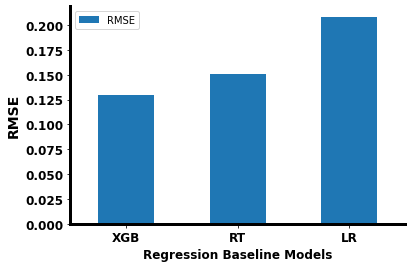

In [78]:
RMSE_df_baseline.plot.bar(x='Regression Baseline Models', y='RMSE', rot=0)
plt.ylabel("RMSE",fontsize = 14,fontweight='bold')
plt.xlabel('Regression Baseline Models',fontsize = 12,fontweight='bold')
    # changing the fontsize of y & x ticks
plt.yticks(fontsize=12,fontweight='bold'), plt.xticks(fontsize=12,fontweight='bold')
plt.show()

Let's run our new function on the processed data and get a baseline score:

This baseline score should help us in knowing whether some set of features we've assembled in our experimentation actually led to any improvement or not.

# Part 2 - Feature Engineering

## Feature Utility Scores

It's time for us to take a closer look at the features we have in our dataset. We will analyze how much potential a feature has by computing its *utility score*.

In [79]:
def make_mi_scores(X, y):
    X = X.copy()
    for colname in X.select_dtypes(["object", "category"]):
        X[colname], _ = X[colname].factorize()
    # All discrete features should now have integer dtypes
    discrete_features = [pd.api.types.is_integer_dtype(t) for t in X.dtypes]
    mi_scores = mutual_info_regression(X, y, discrete_features=discrete_features, random_state=0)
    mi_scores = pd.Series(mi_scores, name='MI Scores', index=X.columns)
    mi_scores = mi_scores.sort_values(ascending=False)
    return mi_scores

def plot_mi_scores(scores): 
    scores = scores.sort_values(ascending=True)
    width = np.arange(len(scores))
    ticks = list(scores.index)
    plt.barh(width, scores)
    plt.yticks(width, ticks)
    plt.title("Mutual Information Scores")


Our feature scores are listed below:

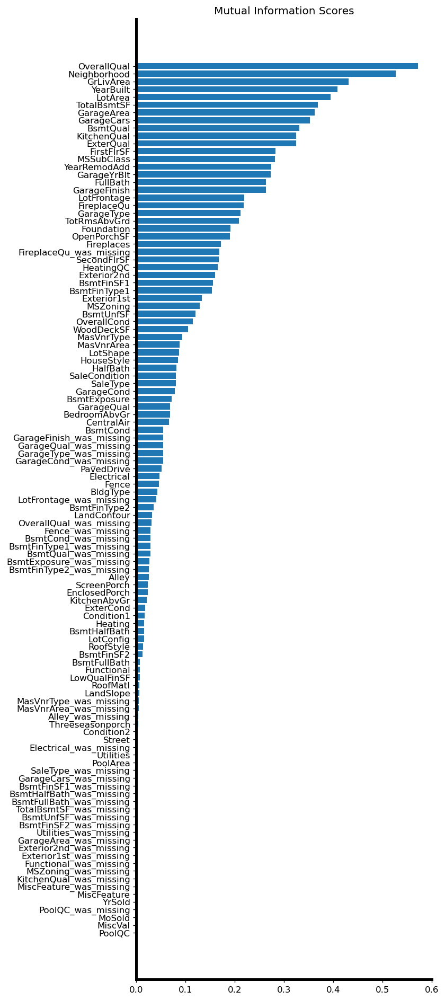

In [80]:
mi_scores = make_mi_scores(X, y)

# Show Mutual Information (MI) score plot
plt.figure(dpi=120, figsize=(6, 20))
plot_mi_scores(mi_scores)


We have a number of features that are highly informative and several that don't seem to be informative at all (at least by themselves). Therefore, we will focus our efforts on the top scoring features. Training on uninformative features can lead to overfitting as well, so features with 0.0 MI scores are going to be dropped entirely.

In [81]:
def drop_uninformative(df, mi_scores):
    return df.loc[:, mi_scores > 0.0]

Let's check if removing these features actually lead to a performance gain.

In [82]:
drop_uninformative(X, mi_scores)

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,...,Functional_was_missing,FireplaceQu_was_missing,GarageType_was_missing,GarageFinish_was_missing,GarageCars_was_missing,GarageArea_was_missing,GarageQual_was_missing,GarageCond_was_missing,Fence_was_missing,SaleType_was_missing
Id,,,,,,,,,,,,,,,,,,,,,
1,5,3,65.0,8450,1,2,1,3,3,4,...,0,1,0,0,0,0,0,0,1,0
2,0,3,80.0,9600,1,2,1,3,3,2,...,0,0,0,0,0,0,0,0,1,0
3,5,3,68.0,11250,1,2,2,3,3,4,...,0,0,0,0,0,0,0,0,1,0
4,6,3,60.0,9550,1,2,2,3,3,0,...,0,0,0,0,0,0,0,0,1,0
5,5,3,84.0,14260,1,2,2,3,3,2,...,0,0,0,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1456,5,3,62.0,7917,1,2,1,3,3,4,...,0,0,0,0,0,0,0,0,1,0
1457,0,3,85.0,13175,1,2,1,3,3,4,...,0,0,0,0,0,0,0,0,0,0
1458,6,3,66.0,9042,1,2,1,3,3,4,...,0,0,0,0,0,0,0,0,0,0


In [83]:
drop_uninformative(X, mi_scores).info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1460 entries, 1 to 1460
Columns: 106 entries, MSSubClass to SaleType_was_missing
dtypes: float64(11), int32(32), int64(19), int8(44)
memory usage: 598.8 KB


In [84]:
X = df_train.copy()
y = X.pop("SalePrice")
X = drop_uninformative(X, mi_scores)

# Check out if this results in any improvement from the baseline score
score_dataset(X, y)

0.12983721979404989

Nice! Removing our uninformative features does lead to a slight performance gain. We will add our new `drop_uninformative` function to our feature-creation pipeline.

## Create Features

To make our feature engineering workflow more modular, we'll define a function that will take a prepared dataframe and pass it through a pipeline of transformations to get the final feature set.

Let's go ahead and define one transformation now--a label encoding for the categorical features. 

*Note that we're specifically using label encoding for our unordered categories because we are using a tree-ensemble, XGBoost, particularly. If instead we decide to try using a linear regression model, we're going to have to use one-hot encoding for features with unordered categories.*

In [85]:
def label_encode(df):
    X = df.copy()
    for colname in X.select_dtypes(['category']):
        X[colname] = X[colname].cat.codes
    return X

### Create Features with Pandas (Data Wrangling)

#### Mathematical Transforms (Ratios)

Ratios seem to be difficult for most models to learn, so creating new features expressing ratio combinations can often lead to some easy performance gains. We're going to create two new features expressing important ratios using mathematical transformation:

- `LivLotRatio`: the ratio of `GrLivArea` to `LotArea`
- `Spaciousness`: the sum of `FirstFlrSF` and `SecondFlrSF` divided by `TotRmsAbvGrd`


In [86]:
def mathematical_transforms(df):
    X = pd.DataFrame() # Just a dataframe to hold new features
    X['LivLotRatio'] = df.GrLivArea / df.LotArea
    X['Spaciousness'] = (df.FirstFlrSF + df.SecondFlrSF) / df.TotRmsAbvGrd
    return X

In [87]:

X = mathematical_transforms(df_train)

In [88]:
X

,LivLotRatio,Spaciousness
Id,,
1,0.202367,213.750000
2,0.131458,210.333333
3,0.158756,297.666667
4,0.179791,245.285714
5,0.154137,244.222222
...,...,...
1456,0.208033,235.285714
1457,0.157343,296.142857
1458,0.258792,260.000000


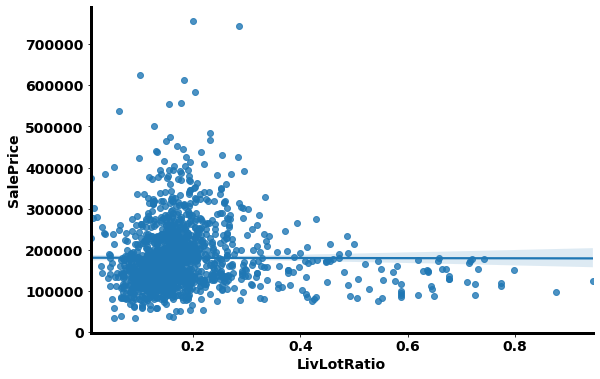

In [89]:
f, ax = plt.subplots(figsize=(9, 6))
# seaborn's regression plot
sns.regplot(x=(X['LivLotRatio']), y=df_train['SalePrice'], data=df_train, order=1)
plt.ylabel('SalePrice',fontsize = 14,fontweight='bold')
plt.xlabel('LivLotRatio',fontsize = 14,fontweight='bold')
    # changing the fontsize of y & x ticks
plt.yticks(fontsize=14,fontweight='bold'), plt.xticks(fontsize=14,fontweight='bold')
plt.show()

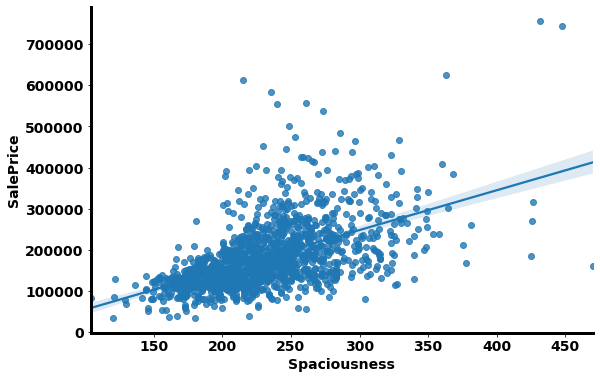

In [90]:
f, ax = plt.subplots(figsize=(9, 6))
# seaborn's regression plot
sns.regplot(x=(X['Spaciousness']), y=df_train['SalePrice'], data=df_train, order=1)
plt.ylabel('SalePrice',fontsize = 14,fontweight='bold')
plt.xlabel('Spaciousness',fontsize = 14,fontweight='bold')
    # changing the fontsize of y & x ticks
plt.yticks(fontsize=14,fontweight='bold'), plt.xticks(fontsize=14,fontweight='bold')
plt.show()

#### Interactions

During an exploratory analysis of our data, something interesting came up:

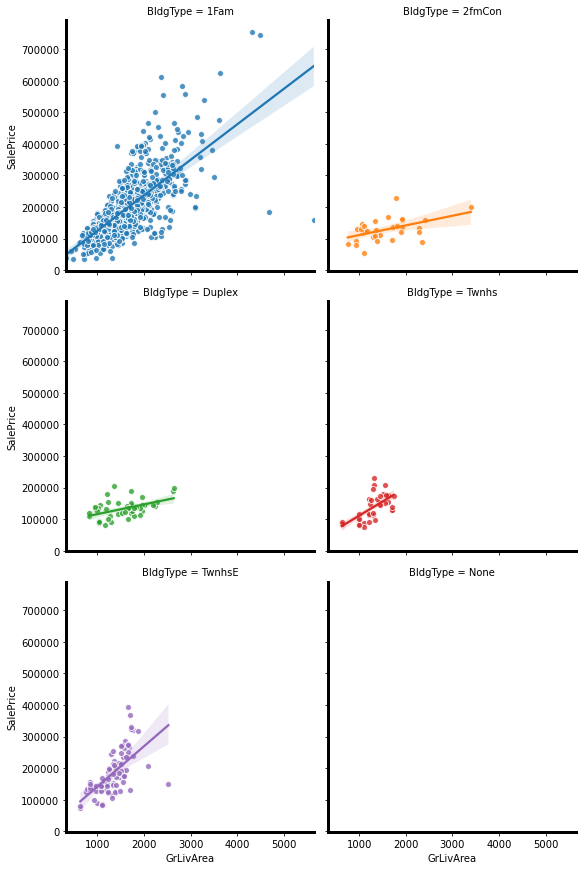

In [91]:
# Check out interaction between `BldgType` and `GrLivArea`
feature = "GrLivArea"

sns.lmplot(x=feature, y="SalePrice", hue="BldgType", col="BldgType",
           data=df_train, scatter_kws={"edgecolor": 'w'}, col_wrap=2, height=4)

The trend lines being significantly different from one category to the next indicates an interaction effect between `GrLivArea` and `BldgType` that relates to a home's `SalePrice`. 

Below are several other detected interaction effects between categorical and numerical variables:

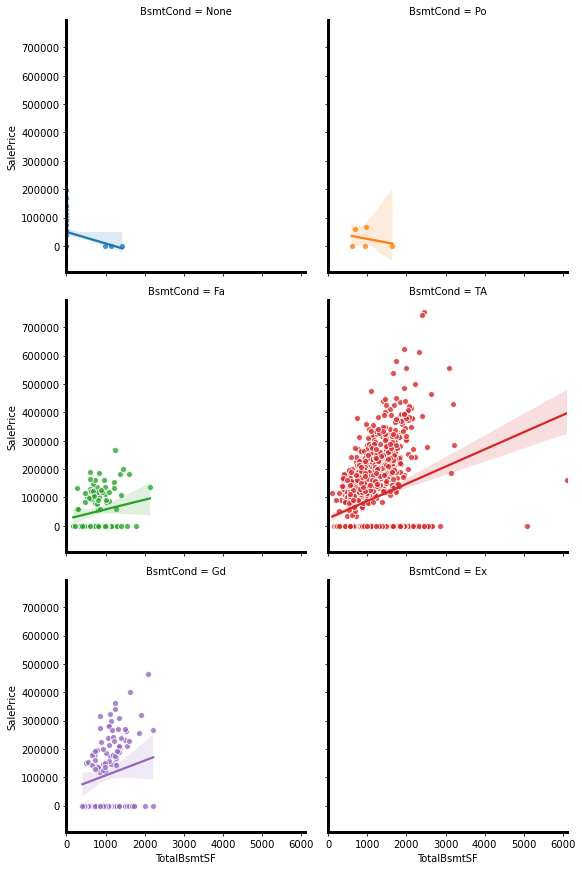

In [92]:
# Check out interaction between `BsmtCond` and `TotalBsmtSF`
feature = "TotalBsmtSF"

sns.lmplot(
    x=feature, y="SalePrice", hue="BsmtCond", col="BsmtCond",
    data=df, scatter_kws={"edgecolor": 'w'}, col_wrap=2, height=4,
);

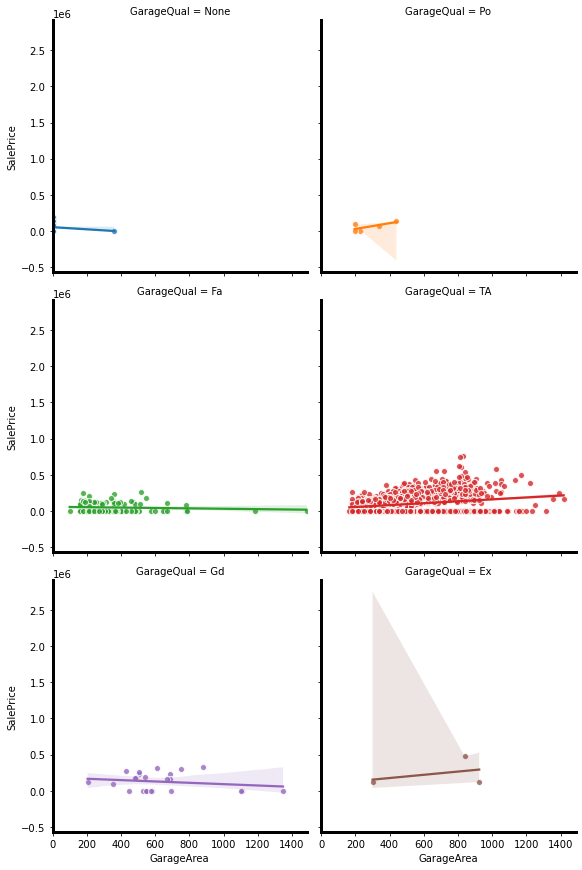

In [93]:
# Check out interaction between `GarageQual` and `GarageArea`
feature = "GarageArea"

sns.lmplot(
    x=feature, y="SalePrice", hue="GarageQual", col="GarageQual",
    data=df, scatter_kws={"edgecolor": 'w'}, col_wrap=2, height=4,
);

In [94]:
def interactions(df):
    # BldgType interaction
    X_inter_1 = pd.get_dummies(df.BldgType, prefix='Bldg')
    X_inter_1 = X_inter_1.mul(df.GrLivArea, axis=0)
    # Bsmt interaction
    X_inter_2 = pd.get_dummies(df.BsmtCond, prefix='BsmtCond')
    X_inter_2 = X_inter_2.mul(df.TotalBsmtSF, axis=0)
    # Garage interaction
    X_inter_3 = pd.get_dummies(df.GarageQual, prefix='GarageQual')
    X_inter_3 = X_inter_3.mul(df.GarageArea, axis=0)
    # Combine into one DataFrame
    X = X_inter_1.join(X_inter_2)
    #X = X.join(X_inter_3)
    return X

#### Counts

Let's create a new feature called `PorchTypes` that describes how many kinds of outdoor areas a dwelling has. We will count how many of the following are greater than 0.0:

-`WoodDeckSF`

-`OpenPorchSF`

-`EnclosedPorch`

-`Threeseasonporch`

-`ScreenPorch`

And then we're going to create another new feature `TotalHalfBath` that contains the sum of half-bathrooms within the property.

Additionally, we will also sum up the total number of rooms (including full and half bathrooms) in each property and store them in a new feature called `TotalRoom`.

In [95]:
def counts(df):
    X = pd.DataFrame()
    X['PorchTypes'] = df[['WoodDeckSF',
                        'OpenPorchSF',
                        'EnclosedPorch',
                        'Threeseasonporch',
                        'ScreenPorch'
                        ]].gt(0.0).sum(axis=1)
    X['TotalHalfBath'] = df.BsmtFullBath + df.BsmtHalfBath
    X['TotalRoom'] = df.TotRmsAbvGrd + df.FullBath + df.HalfBath
    return X

#### Grouped Transform

The value of a home often depends on how it compares to typical homes in its neighborhood. Therefore, let's create a new feature called `MedNhbdArea` that describes the *median* of `GrLivArea` grouped on `Neighborhood`.

In [96]:
def group_transforms(df):
    X = pd.DataFrame()
    X['MedNhbdArea'] = df.groupby('Neighborhood')['GrLivArea'].transform('median')
    return X

### k-Means Clustering

Let's use the help of an unsupervised algorithm (k-mean clustering) to create new features. We've selected the following features to determine what the clusters are based on.

In [97]:
cluster_features = [
    "LotArea",
    "TotalBsmtSF",
    "FirstFlrSF",
    "SecondFlrSF",
    "GrLivArea",
]

In [98]:
def cluster_labels(df, features, n_clusters=20):
    X = df.copy()
    X_scaled = X.loc[:, features]
    X_scaled = (X_scaled - X_scaled.mean(axis=0)) / X_scaled.std(axis=0)
    kmeans = KMeans(n_clusters=n_clusters, n_init=50, random_state=0)
    X_new = pd.DataFrame()
    X_new["Cluster"] = kmeans.fit_predict(X_scaled)
    return X_new

In [99]:
X_new = cluster_labels(df_train, cluster_features, n_clusters=20)

In [100]:
X = df.copy()
X_scaled = X.loc[:, cluster_features]
X_scaled = (X_scaled - X_scaled.mean(axis=0)) / X_scaled.std(axis=0)

In [101]:
from sklearn.cluster import KMeans
wcss=[]
for i in range(1,30):
    kmeans=KMeans(n_clusters=i)
    kmeans.fit(X_scaled)
    wcss.append(kmeans.inertia_)

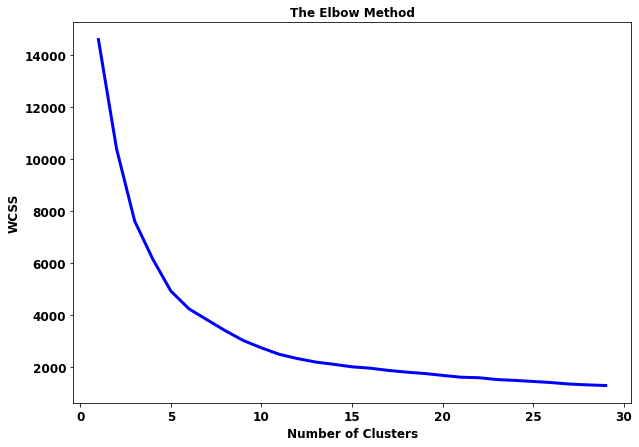

In [43]:
plt.figure(figsize=(10, 7))
plt.plot(range(1,30),wcss,'b-',lw=3.0)
plt.title('The Elbow Method',fontsize = 12,fontweight='bold')
plt.xlabel('Number of Clusters',fontsize = 12,fontweight='bold')
plt.ylabel('WCSS',fontsize = 12,fontweight='bold')
#plt.show()
import matplotlib as mpl
mpl.rcParams["axes.spines.right"] = False; mpl.rcParams["axes.spines.top"] = False
from pylab import *
rc('axes', linewidth=3)
fontsize = 12
ax = gca()
for tick in ax.xaxis.get_major_ticks():
    tick.label1.set_fontsize(fontsize)
    tick.label1.set_fontweight('bold')
for tick in ax.yaxis.get_major_ticks():
    tick.label1.set_fontsize(fontsize)
    tick.label1.set_fontweight('bold')
plt.show()

In [47]:
# Clustering Metrics calculation
def clustering_metrics(labels,clusters,vector,model):
  from sklearn import metrics
  kappa=metrics.cohen_kappa_score(labels, clusters,weights='linear')
  cluster_silhouette=metrics.silhouette_score(vector, clusters, metric='euclidean')
  human_silhouette=metrics.silhouette_score(vector,labels,metric='euclidean')
  homogeneity=metrics.homogeneity_score(labels, clusters)
  completeness=metrics.completeness_score(labels, clusters)
  v_meas=metrics.v_measure_score(labels, clusters)
  ARI=metrics.adjusted_rand_score(labels, clusters)
  AMI=metrics.adjusted_mutual_info_score(labels,clusters)
  cluster_metrics=pd.DataFrame({'kappa':kappa,'cluster_silhouette':cluster_silhouette,
                              'human_silhouette':human_silhouette, 'homogeneity':homogeneity,
                              'completeness':completeness,'v_meas':v_meas,
                             'ARI':ARI,'AMI':AMI},index=[model])
  return cluster_metrics

In [48]:
# Adding the data to a dataframe in order to visualize it on a scatter plot.
def Km_visualize(clusters,PCA_components,y_predicted,cluster_center):
  # We now plot the results found from k-means clustering algorithm on a scatter plot.
  filtered_label0 = PCA_components[y_predicted == 0]
  filtered_label1 = PCA_components[y_predicted == 1]
  filtered_label2 = PCA_components[y_predicted == 2]
  filtered_label3 = PCA_components[y_predicted == 3]
  filtered_label4 = PCA_components[y_predicted == 4]

  plt.scatter(filtered_label0.iloc[:,0] , filtered_label0.iloc[:,1] , s = 50)
  plt.scatter(filtered_label1.iloc[:,0] , filtered_label1.iloc[:,1] , s = 50)
  plt.scatter(filtered_label2.iloc[:,0] , filtered_label2.iloc[:,1] , s = 50)
  plt.scatter(filtered_label3.iloc[:,0] , filtered_label3.iloc[:,1] , s = 50)
  plt.scatter(filtered_label4.iloc[:,0] , filtered_label4.iloc[:,1] , s = 50)
  plt.scatter(cluster_center[:,0],cluster_center[:,1],marker='x',s=150,c='k',label='Centroids')
  fig = plt.gcf()
  fig.set_size_inches(15, 8)
  plt.figure()

In [56]:
def silhouette_vis(PCA_components):
  from sklearn.metrics import silhouette_score,silhouette_samples
  from matplotlib import cm
  for clusters in [5]:
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    clusterer = KMeans(n_clusters=clusters, random_state=10)
    cluster_labels = clusterer.fit_predict(PCA_components)
    silhouette_avg = silhouette_score(PCA_components, cluster_labels)
    print('The average silhouette score = {} for {} clusters'.format(silhouette_avg,clusters))

    sample_silhouette_values = silhouette_samples(PCA_components, cluster_labels)

    y_lower = 10
    for i in range(clusters):
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))
        y_lower = y_upper + 10  

    ax1.set_title("Silhouette Visualization",fontsize = 12,fontweight='bold')
    ax1.set_xlabel("Silhouette Coefficient",fontsize = 12,fontweight='bold')
    ax1.set_ylabel("Cluster Label",fontsize = 12,fontweight='bold')

    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([]) 
    colors = cm.nipy_spectral(cluster_labels.astype(float) / clusters)
    ax2.scatter(PCA_components.iloc[:, 0], PCA_components.iloc[:, 1], marker='.', s=30, lw=0, alpha=0.7,
                c=colors, edgecolor='k')

    centers = clusterer.cluster_centers_
    ax2.scatter(centers[:, 0], centers[:, 1], marker='o',
                c="white", alpha=1, s=200, edgecolor='k')

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1,
                    s=50, edgecolor='k')

    ax2.set_title("Clusters Visualization",fontsize = 12,fontweight='bold')
    ax2.set_xlabel("PC1",fontsize = 12,fontweight='bold')
    ax2.set_ylabel("PC2",fontsize = 12,fontweight='bold')
    plt.suptitle(("Silhouette analysis for KMeans with clusters = %d" % clusters),fontsize=14, fontweight='bold')
    plt.show()

In [50]:
def k_means(vector,n):
  from sklearn.cluster import KMeans
  km_model = KMeans(n_clusters=n).fit(vector)
  clusters = km_model.labels_
  y_predicted = km_model.fit_predict(vector)
  cluster_center=km_model.cluster_centers_
  return clusters,y_predicted,cluster_center

In [51]:
def pca(vector):
  from sklearn.decomposition import PCA
  pca_trans = PCA(n_components=2).fit_transform(vector)
  PCA_components = pd.DataFrame(data = pca_trans)
  return pca_trans,PCA_components

In [52]:
pca_trans, PCA_components = pca(X_scaled)

In [53]:
clusters,y_predicted,cluster_center=k_means(PCA_components,5)

In [54]:
Km_metrics=clustering_metrics(y_predicted,clusters,PCA_components,'None')
Km_metrics

,kappa,cluster_silhouette,human_silhouette,homogeneity,completeness,v_meas,ARI,AMI
None,0.762908,0.474776,0.474691,0.998221,0.998658,0.99844,0.999493,0.998437


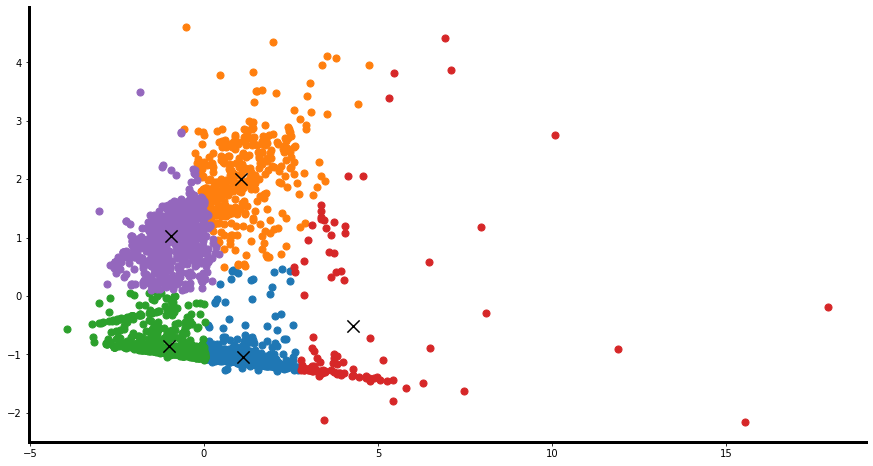

<Figure size 432x288 with 0 Axes>

In [55]:
Km_visualize(clusters,PCA_components,y_predicted,cluster_center)

The average silhouette score = 0.47469124131383106 for 5 clusters


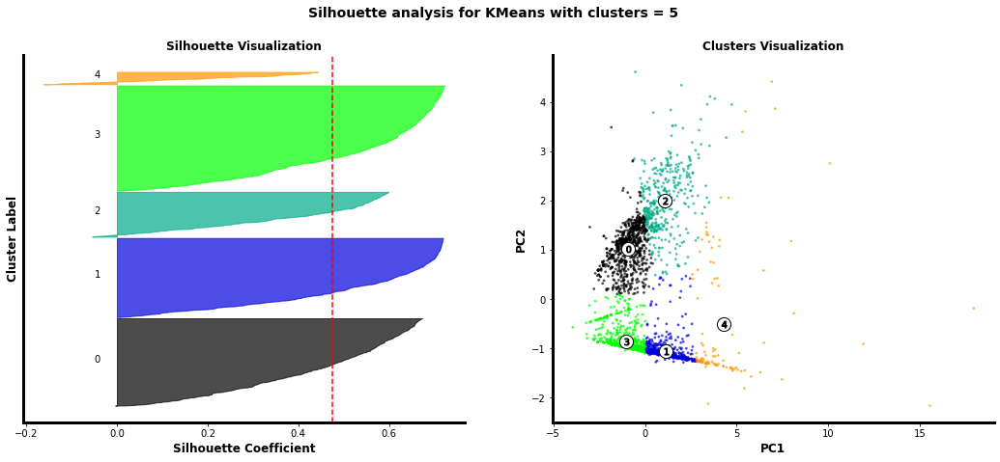

In [57]:
silhouette_vis(PCA_components=PCA_components)

The Silhouette Coefficient is defined for each sample and is composed of two scores:
a: The mean distance between a sample and all other points in the same cluster.
b: The mean distance between a sample and all other points in the next nearest cluster.

The Silhouette Coefficient for a set of samples is given as the mean of the Silhouette Coefficient for each sample. The score is bounded between -1 for incorrect clustering and +1 for highly dense clustering. Scores around zero indicate overlapping clusters. The score is higher when clusters are dense and well separated, which relates to a standard concept of a cluster

Hierarchical Clustering (Agglomerative Algorithm)
Hierarchical Clustering using BOW
We now plot a dendogram first to find out the number of clusters. To find the value of n add a horizontal line across the dendogram that cuts the long vertical lines and not the small vertical lines(clusters). Now count the total vertical lines that this horizontal line cuts to find the number of clusters to pass to you model.

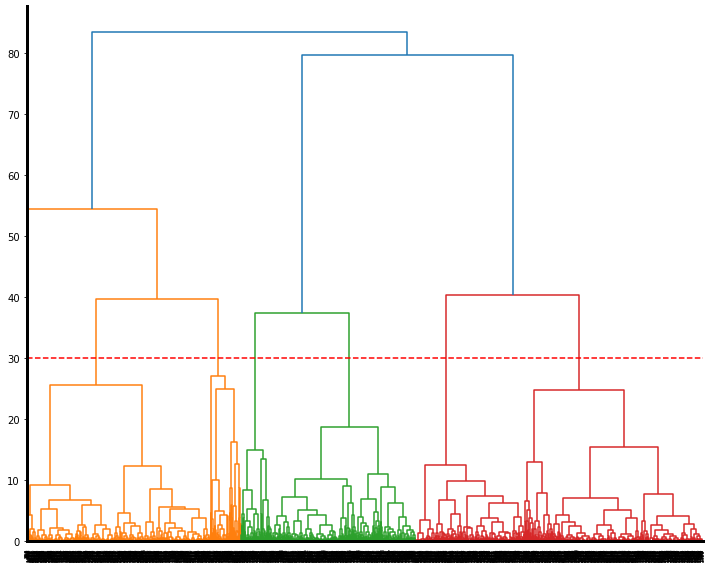

In [58]:
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import ward, dendrogram
from sklearn.metrics.pairwise import cosine_similarity
import scipy.cluster.hierarchy as sch
linkage_matrix = ward(X_scaled)
dendo = plt.subplots(figsize=(10, 8)) 
dendo = dendrogram(linkage_matrix, orientation="top");
plt.axhline(y=30, color='r', linestyle='--')
plt.tight_layout()

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.


(2919, 5)
(2919, 2)
             0         1
0    -0.484956  1.470021
1     0.103709 -1.046678
2    -0.114554  1.489992
3    -0.412077  1.290616
4     1.057545  1.951830
...        ...       ...
2914 -2.258169  0.687497
2915 -2.259972  0.687409
2916  0.409492 -1.013038
2917 -1.011574 -0.920030
2918  0.252398  1.850260

[2919 rows x 2 columns]


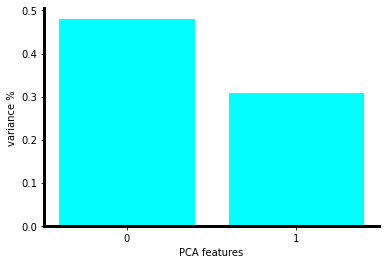

In [60]:
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
pca = PCA(n_components=2)
pca_bow = pca.fit_transform(X_scaled)
tsne_bow=TSNE(n_components=2).fit_transform(X_scaled)
# Plot the explained variances
features = range(pca.n_components_)
plt.bar(features, pca.explained_variance_ratio_, color='cyan')
plt.xlabel('PCA features')
plt.ylabel('variance %')
plt.xticks(features)
# Save components to a DataFrame
PCA_components = pd.DataFrame(data = pca_bow)
TSNE_components=pd.DataFrame(data=tsne_bow)
print(X_scaled.shape)
print(PCA_components.shape)
print(PCA_components)

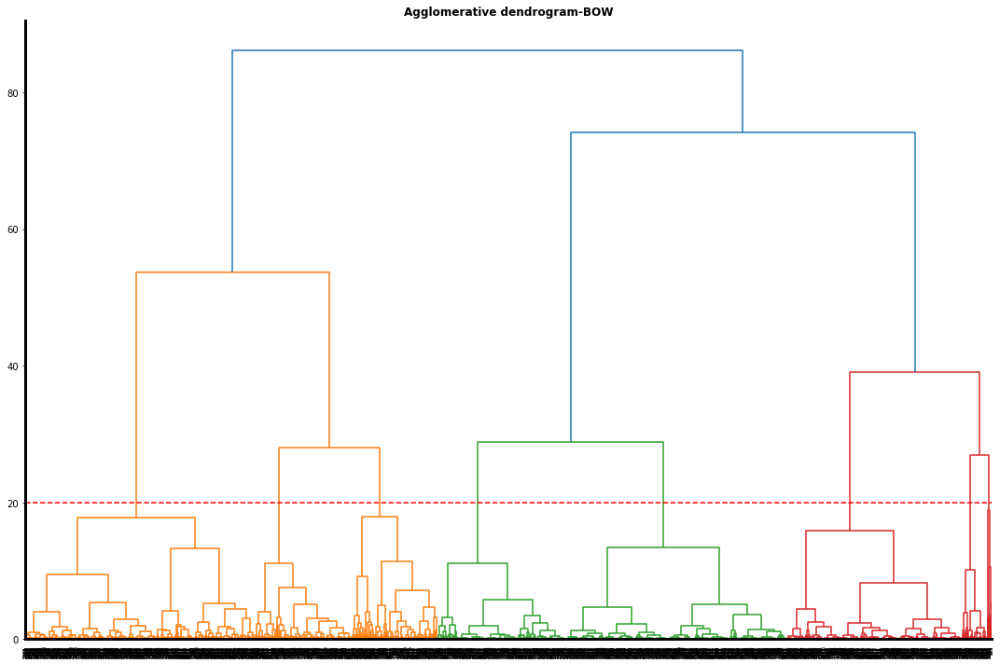

In [67]:
linkage_matrix = ward(PCA_components)
dendo = plt.subplots(figsize=(15, 10)) 
dendo = dendrogram(linkage_matrix, orientation="top");
plt.axhline(y=20, color='r', linestyle='--')
plt.title('Agglomerative dendrogram-BOW', fontsize = 12,fontweight='bold')
plt.tight_layout() 

In [61]:
# Implementing the hierarchical clustering.
hc = AgglomerativeClustering(n_clusters=6, linkage='ward')
hc_predict = hc.fit_predict(PCA_components)

In [62]:
# Clustering Mertrics calculation
def clustering_metrics(labels,clusters,vector,model):
  from sklearn import metrics
  kappa=metrics.cohen_kappa_score(labels, clusters,weights='linear')
  cluster_silhouette=metrics.silhouette_score(vector, clusters, metric='euclidean'),
  human_silhouette=metrics.silhouette_score(vector,labels,metric='euclidean')
  homogeneity=metrics.homogeneity_score(labels, clusters)
  completeness=metrics.completeness_score(labels, clusters)
  v_meas=metrics.v_measure_score(labels, clusters)
  ARI=metrics.adjusted_rand_score(labels, clusters)
  AMI=metrics.adjusted_mutual_info_score(labels,clusters)
  cluster_metrics=pd.DataFrame({'kappa':kappa,'cluster_silhouette':cluster_silhouette,
                              'human_silhouette':human_silhouette, 'homogeneity':homogeneity,
                              'completeness':completeness,'v_meas':v_meas,
                             'ARI':ARI,'AMI':AMI},index=[model])
  return cluster_metrics

In [63]:
clustering_metrics=clustering_metrics(hc_predict,hc_predict,PCA_components,'None')
clustering_metrics

,kappa,cluster_silhouette,human_silhouette,homogeneity,completeness,v_meas,ARI,AMI
None,1.0,0.431418,0.431418,1.0,1.0,1.0,1.0,1.0


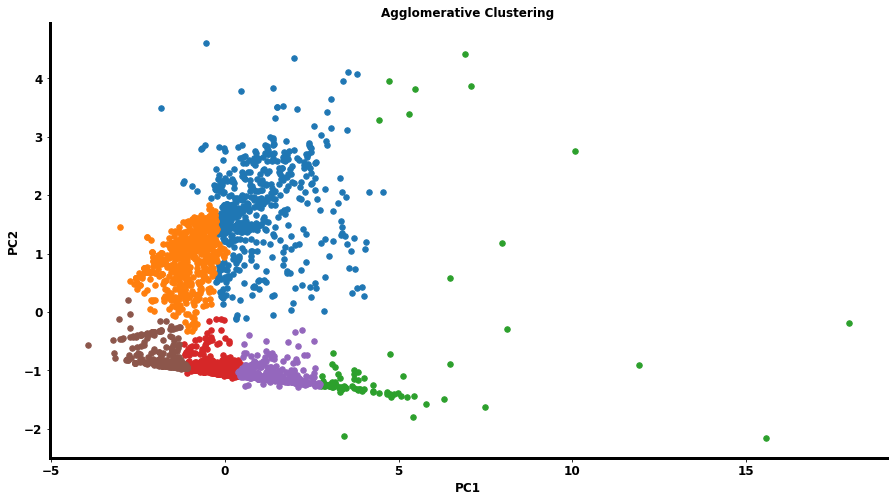

In [65]:
#Now plot the results in a scatterplot.
for i in range(len(hc_predict)):
    filtered_label_hc = PCA_components[hc_predict == i]
    plt.scatter(filtered_label_hc.iloc[:,0] , filtered_label_hc.iloc[:,1] , s = 30)
fig = plt.gcf(); fig.set_size_inches(15, 8)
plt.title('Agglomerative Clustering', fontsize = 12,fontweight='bold')
plt.xlabel("PC1", fontsize = 12,fontweight='bold')
plt.ylabel("PC2", fontsize = 12,fontweight='bold')
import matplotlib as mpl
mpl.rcParams["axes.spines.right"] = False; mpl.rcParams["axes.spines.top"] = False
from pylab import *
rc('axes', linewidth=3)
fontsize = 12
ax = gca()
for tick in ax.xaxis.get_major_ticks():
    tick.label1.set_fontsize(fontsize)
    tick.label1.set_fontweight('bold')
for tick in ax.yaxis.get_major_ticks():
    tick.label1.set_fontsize(fontsize)
    tick.label1.set_fontweight('bold')
#plt.figure()

In [68]:
# # Optimize number of clusters
# # by comparing cross validation scores
# # (Will take some time--like HOURS)

# for n in list(range(1,21)):
#     X_orig = df_train.copy().drop("SalePrice", axis=1)
#     X = cluster_labels(df_train, cluster_features, n_clusters=n)
#     X = X_orig.join(X)
#     score = score_dataset(X, y, xgb)
#     print("Cross-validation score:", score, 
#         "\n Value used for n_clusters (number of clusters) for labeling:n=", n)

Next, we will use the *distance* of the observations to each cluster as another new feature.

In [102]:
def cluster_distance(df, features, n_clusters=20):
    X = df.copy()
    X_scaled = X.loc[:, features]
    X_scaled = (X_scaled - X_scaled.mean(axis=0)) / X_scaled.std(axis=0)
    kmeans = KMeans(n_clusters=20, n_init=50, random_state=0)
    X_cd = kmeans.fit_transform(X_scaled)
    # Label features and join to dataset
    X_cd = pd.DataFrame(
        X_cd, columns=[f"Centroid_{i}" for i in range(X_cd.shape[1])]
    )
    return X_cd

In [103]:
# # Optimize number of clusters
# # by comparing cross validation scores
# # (Will take some time--like HOURS)

# for n in list(range(1,21)):
#     X_orig = df_train.copy().drop("SalePrice", axis=1)
#     X = cluster_distance(df_train, cluster_features, n_clusters=n)
#     X = X_orig.join(X)
#     score = score_dataset(X, y, xgb)
#     print("Cross-validation score:", score, 
#         "\n Value used for n_clusters (number of clusters) for labeling:n=", n)

### Principal Component Analysis

This time we'll use PCA, another unsupervised learning method, to create more new features.

*Note: We are not including missing value indicator columns when assessing correlations because the combinations of rows having many 0s in these indicator columns will yield a NaN result when the given numerator and denominator are equal to 0 during the calculation.*

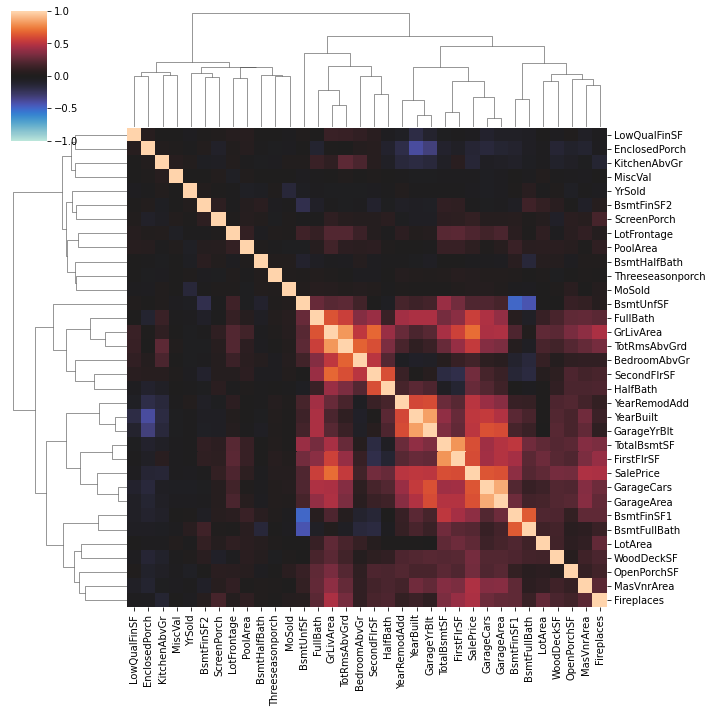

In [104]:
def corrplot(df, method="pearson", annot=True, **kwargs):
    sns.clustermap(df.corr(method), vmin=-1.0, vmax=1.0, cmap="icefire", method="complete", annot=annot,**kwargs)

corrplot(df_train.iloc[:,:80], annot=None)


In [105]:
def apply_pca(X, standardize=True):
    # Standardize
    if standardize:
        X = (X - X.mean(axis=0)) / X.std(axis=0)
    # Create principal components
    pca = PCA()
    X_pca = pca.fit_transform(X)
    # Convert to dataframe
    component_names = [f"PC{i+1}" for i in range(X_pca.shape[1])]
    X_pca = pd.DataFrame(X_pca, columns=component_names)
    # Create loadings
    loadings = pd.DataFrame(
        pca.components_.T,  # transpose the matrix of loadings
        columns=component_names,  # so the columns are the principal components
        index=X.columns,  # and the rows are the original features
    )
    return pca, X_pca, loadings


def plot_variance(pca, width=8, dpi=100):
    # Create figure
    fig, axs = plt.subplots(1, 2)
    n = pca.n_components_
    grid = np.arange(1, n + 1)
    # Explained variance
    evr = pca.explained_variance_ratio_
    axs[0].bar(grid, evr)
    axs[0].set(
        xlabel="Component", title="% Explained Variance", ylim=(0.0, 1.0)
    )
    # Cumulative Variance
    cv = np.cumsum(evr)
    axs[1].plot(np.r_[0, grid], np.r_[0, cv], "o-")
    axs[1].set(
        xlabel="Component", title="% Cumulative Variance", ylim=(0.0, 1.0)
    )
    # Set up figure
    fig.set(figwidth=8, dpi=100)
    return axs

Let's pick a subset of features for PCA:

In [106]:
pca_features = [
    "GarageArea",
    "YearRemodAdd",
    "TotalBsmtSF",
    "GrLivArea",
]

The PCA algorithm gives us *loadings* which describe each *component* of variation, and also the components which were the transformed datapoints. The loadings can suggest features to create. Additionally, we can use the components as features directly.

In [107]:
X_temp = X.loc[:, pca_features]

# `apply_pca`, defined above, reproduces the code from the tutorial
pca, X_pca, loadings = apply_pca(X_temp)
print(loadings)

                   PC1       PC2       PC3       PC4
GarageArea    0.541203  0.102571 -0.037615  0.833765
YearRemodAdd  0.427041 -0.886783 -0.047619 -0.170250
TotalBsmtSF   0.510171  0.359397 -0.667927 -0.405503
GrLivArea     0.514258  0.271900  0.741748 -0.333794


array([<AxesSubplot:title={'center':'% Explained Variance'}, xlabel='Component'>,
       <AxesSubplot:title={'center':'% Cumulative Variance'}, xlabel='Component'>],
      dtype=object)

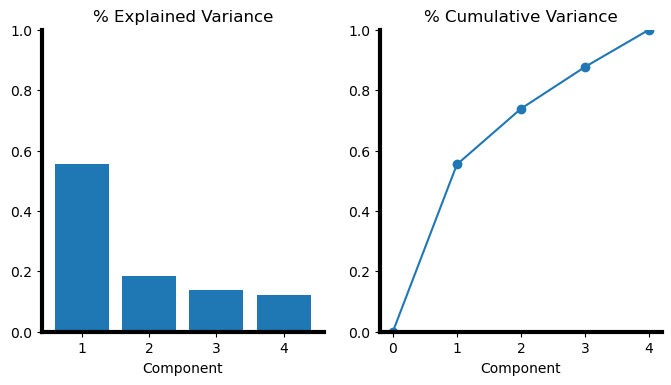

In [108]:
# Plot explained variance based on components from PCA
plot_variance(pca)

Since our goal right now is to use the results of PCA to discover one or more new features that could improve the performance of our model, let's create features inspired by the loadings:

In [109]:
def pca_inspired(df):
    X = pd.DataFrame()
    X["GrLivAreaPlusBsmtSF"] = df.GrLivArea + df.TotalBsmtSF
    X["RecentRemodLargeBsmt"] = df.YearRemodAdd * df.TotalBsmtSF
    return X

def pca_components(df, features):
    X = df.loc[:, features]
    _, X_pca, _ = apply_pca(X)
    return X_pca

#### PCA Application - Indicate Outliers

Applying PCA can also help us determine houses that are outliers or houses having values not well represented in the rest of the data.

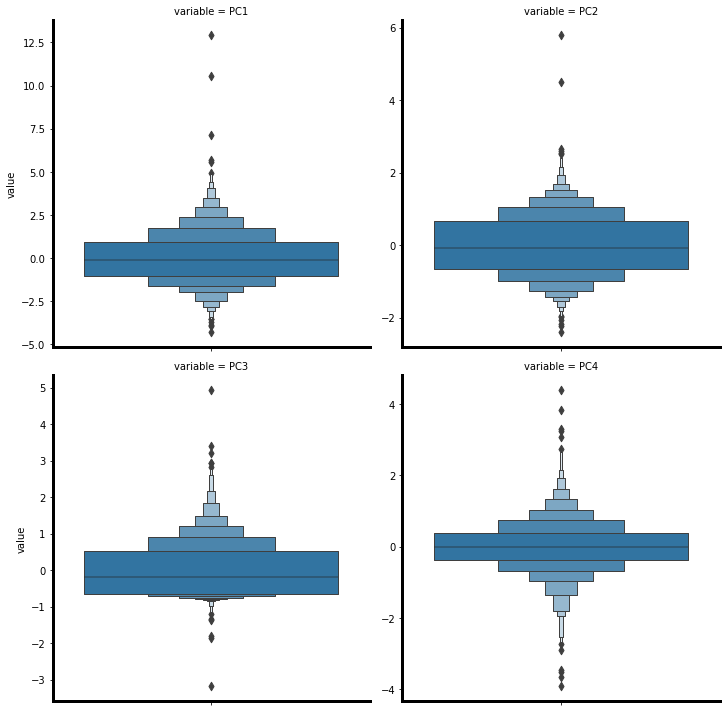

In [110]:
sns.catplot(
    y="value",
    col="variable",
    data=X_pca.melt(),
    kind='boxen',
    sharey=False,
    col_wrap=2,
);

As you can see, for each of the components there are several points lying at the extreme ends of the distributions -- they are outliers. Let's see those houses that sit at the extremes of a component:

In [111]:
# Can change PC1 to PC2, PC3, or PC4
component = "PC1"

idx = X_pca[component].sort_values(ascending=False).index

df_train[["SalePrice", "Neighborhood", "SaleCondition"] + pca_features].iloc[idx]

IndexError: positional indexers are out-of-bounds

Notice that there are several dwellings listed as `Partial` sales in the `Edwards` neighborhood that stand out. A partial sale is what occurs when there are multiple owners of a property and one or more of them sell their "partial" ownership of the property. These kinds of sales often happen during the settlement of a family estate or the dissolution of a business and aren't advertised publicly, making these cases true outliers, especially within our supposed research context--houses on the open market.

Some models can benefit from having these outliers indicated, which is what this next transform will do.

In [112]:
def indicate_outliers(df):
    X_new = pd.DataFrame()
    X_new["Outlier"] = (df.Neighborhood == "Edwards") & (df.SaleCondition == "Partial")
    return X_new

### Target Encoding

We're going to use target encoding using the following steps:
1. Split the data into folds, each fold having two splits of the dataset.
2. Train the encoder on one split but transform the values of the other.
3. Repeat for all the splits.

The next cell contains a wrapper we can use with any target encoder:

In [113]:
class CrossFoldEncoder:
    def __init__(self, encoder, **kwargs):
        self.encoder_ = encoder
        self.kwargs_ = kwargs  # keyword arguments for the encoder
        self.cv_ = KFold(n_splits=5)

    # Fit an encoder on one split and transform the feature on the
    # other. Iterating over the splits in all folds gives a complete
    # transformation. We also now have one trained encoder on each
    # fold.
    def fit_transform(self, X, y, cols):
        self.fitted_encoders_ = []
        self.cols_ = cols
        X_encoded = []
        for idx_encode, idx_train in self.cv_.split(X):
            fitted_encoder = self.encoder_(cols=cols, **self.kwargs_)
            fitted_encoder.fit(
                X.iloc[idx_encode, :], y.iloc[idx_encode],
            )
            X_encoded.append(fitted_encoder.transform(X.iloc[idx_train, :])[cols])
            self.fitted_encoders_.append(fitted_encoder)
        X_encoded = pd.concat(X_encoded)
        X_encoded.columns = [name + "_encoded" for name in X_encoded.columns]
        return X_encoded

    # To transform the test data, average the encodings learned from
    # each fold.
    def transform(self, X):
        from functools import reduce

        X_encoded_list = []
        for fitted_encoder in self.fitted_encoders_:
            X_encoded = fitted_encoder.transform(X)
            X_encoded_list.append(X_encoded[self.cols_])
        X_encoded = reduce(
            lambda x, y: x.add(y, fill_value=0), X_encoded_list
        ) / len(X_encoded_list)
        X_encoded.columns = [name + "_encoded" for name in X_encoded.columns]
        return X_encoded

Note:

To use, follow code sample below:

`encoder = CrossFoldEncoder``(MEstimateEncoder, m=1)`

`X_encoded = encoder.fit_transform(X, y, cols=["MSSubClass"]))`



### Create Final Feature Set

Time to combine everything together.

In [114]:
def create_features(df, df_test=None):
    X = df.copy()
    y = X.pop('SalePrice')
    mi_scores = make_mi_scores(X, y)
    # Combine splits if test data is given
    #
    # If we're creating features for test set predictions, we should
    # use all the data we have available. After creating our features,
    # we'll recreate the splits.
    if df_test is not None:
        X_test = df_test.copy()
        X_test.pop("SalePrice")
        X = pd.concat([X, X_test])

    # Step 1: Drop features with low Mutual Information scores
    X = drop_uninformative(X, mi_scores)

    # Step 2: Add features from mathematical transforms 
    ######## (`LivLotRatio`, `Spaciousness`)
    X = X.join(mathematical_transforms(X))

    # Step 3: Add features from known interaction effects 
    ######## (categorical-`BldgType`and continuous-`GrLivArea`)
    #X = X.join(interactions(X))

    # Step 4: Add new feature from counts 
    ######## (`PorchTypes`, `TotalHalfBath`, `TotalRoom`)
    X = X.join(counts(X))

    # Step 5: Add new feature from group transform
    ######## (median `GrLivArea` by `neighborhood`)
    X = X.join(group_transforms(X))

    # Step 6: Add features from k-means clustering 
    ######## (cluster labels, cluster distance)
    #X = X.join(cluster_labels(X, cluster_features, n_clusters=20))
    #X = X.join(cluster_distance(X, cluster_features, n_clusters=20))

    # Step 7: Add features from PCA
    ######## (loadings-inspired features , PCA components, & outlier indicators)
    X = X.join(pca_inspired(X))
    #X = X.join(pca_components(X, pca_features))
    #X = X.join(indicate_outliers(X))
  
    # Label encoding for the categorical features
    X = label_encode(X)

    # Reform splits
    if df_test is not None:
        X_test = X.loc[df_test.index, :]
        X.drop(df_test.index, inplace=True)

    # Step 8: Target Encoder
    encoder = CrossFoldEncoder(MEstimateEncoder, m=1)
    X = X.join(encoder.fit_transform(X, y, cols=["MSSubClass"]))
    if df_test is not None:
        X_test = X_test.join(encoder.transform(X_test))

    if df_test is not None:
        return X, X_test
    else:
        return X

Putting the transformations into separate functions makes it easier to experiment with various combination.

We can modify any of these transformations or come up with some more ideas to add to the pipeline. At this stage, we have left the ones that gave the best results uncommented.

In [115]:
#df_train, df_test = load_data()
X_train = create_features(df_train)
y_train = df_train.loc[:, 'SalePrice']

In [58]:
# Regression Tree Model
reg_tree = DecisionTreeRegressor(max_leaf_nodes=90, random_state=0)

In [59]:
# Hyper parameters range intialization for tuning 

parameters={"splitter":["best","random"],
            "max_depth" : [1,3,5,7,9,11,12],
           "min_samples_leaf":[1,2,3,4,5,6,7,8,9,10],
           "min_weight_fraction_leaf":[0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9],
           "max_features":["auto","log2","sqrt",None],
           "max_leaf_nodes":[None,10,20,30,40,50,60,70,80,90] }

In [60]:
# calculating different regression metrics

from sklearn.model_selection import GridSearchCV

In [61]:
tuning_model=GridSearchCV(reg_tree,param_grid=parameters,scoring='neg_mean_squared_error',cv=5,verbose=3)

In [62]:
tuning_model.fit(X_train,y_train)

Fitting 5 folds for each of 50400 candidates, totalling 252000 fits
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-3028043312.595 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-3341021714.999 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-4397174186.269 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-3262074834.041 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-4091968231.220 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=None, m

[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.6, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.6, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.6, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.6, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.6, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.6, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_fe

[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-4397174186.269 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-3262074834.041 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-4091968231.220 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-3439603273.355 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-4201763125.578 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random

[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_

[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-7598674724.641 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-5162136543.909 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-6708107197.896 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.6, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.6, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.6, splitter=best;, score=nan total time=

[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-5366806704.196 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-3583785305.438 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-4744104725.454 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-3028043312.595 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-3341021714.999 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best

[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.8, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.8, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.8, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, ma

[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-3936488608.108 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-4833082167.594 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-3437204436.244 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-5124310014.530 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-5533671279.358 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;,

[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-3341021714.999 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-4397174186.269 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-3262074834.041 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-4091968231.220 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-3439603273.355 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;,

[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.6, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.6, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.6, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.6, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.7, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.7, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, 

[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-5366806704.196 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-3583785305.438 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-4744104725.454 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-3081543810.732 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-3656035649.503 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best

[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best;, score=-4397174186.269 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best;, score=-3262074834.041 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best;, score=-4091968231.220 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random;, score=-3439603273.355 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random;, score=-4201763125.578 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random

[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.7, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.7, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.7, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.7, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.7, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.7, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1

[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-3936488608.108 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-4833082167.594 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-3437204436.244 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-5124310014.530 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random;, score=-5533671279.358 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random;,

[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score=-3439603273.355 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score=-4201763125.578 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score=-5366806704.196 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score=-3583785305.438 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score=-4744104725.454 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.2, spl

[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.8, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.8, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.8, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.8, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.8, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, 

[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-5124310014.530 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-5533671279.358 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-6321559275.718 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-7598674724.641 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-5162136543.909 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score

[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-4744104725.454 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-3028043312.595 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-3341021714.999 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-4397174186.269 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-3262074834.041 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-409196

[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=a

[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.6, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.6, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.6, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.6, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.6, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.6, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto,

[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-4091968231.220 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-3439603273.355 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-4201763125.578 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-5366806704.196 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-3583785305.438 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score

[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-3028043312.595 total time=   0.0s
[CV 2/5] END max_depth=1

[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.6, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.6, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.7, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.7, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.7, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.7, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=aut

[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-3583785305.438 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-4744104725.454 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best;, score=-3052070902.879 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best;, score=-3240071022.767 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best;, score=-4451916728.722 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best;, score=-3424

[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-3341021714.999 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-4397174186.269 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-3262074834.041 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-4091968231.220 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-3439603273.355 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-4201

[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.7, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.7, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.7, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.7, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.7, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.8, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_featur

[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-4383811633.585 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-3439603273.355 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-4201763125.578 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-5366806704.196 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-3583785305.438 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score

[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, score=-3028043312.595 total time=   0.0s
[CV 2/5] END max_depth=1

[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.6, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.6, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.6, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.6, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.6, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.7, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_featur

[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-3439603273.355 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-4201763125.578 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-5366806704.196 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-3583785305.438 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-4744104725.454 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best;,

[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-3028043312.595 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-3341021714.999 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-4397174186.269 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-3262074834.041 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-4091968231.220 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-343960

[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.7, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.7, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.7, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.7, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.7, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.7, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto,

[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best;, score=-3240071022.767 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best;, score=-4451916728.722 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best;, score=-3424459364.964 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best;, score=-4091685658.999 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random;, score=-3439603273.355 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random;, score=-4201

[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-3028043312.595 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-3341021714.999 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-4397174186.269 total time=   0.0s
[CV 

[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.6, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.6, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.6, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.6, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.6, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.6, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_featur

[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-3439603273.355 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-4201763125.578 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-5366806704.196 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-3583785305.438 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-4744104725.454 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score

[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-3028043312.595 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-3341021714.999 total time=   0.0s
[CV 3/5] END m

[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.6, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.6, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.6, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.6, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.6, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.6, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=a

[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random;, score=-4744104725.454 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best;, score=-3081543810.732 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best;, score=-3656035649.503 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best;, score=-4666364377.467 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best;, score=-3396756527.287 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best;, score=-438381

[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-4201763125.578 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-5366806704.196 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-3583785305.438 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-4744104725.454 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-3028043312.595 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-

[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.7, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.7, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.7, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.7, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.7, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.7, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_featur

[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=-3242823531.802 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=-3936488608.108 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=-4833082167.594 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=-3437204436.244 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=-5124310014.530 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-553367

[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, score=-3341021714.999 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, score=-4397174186.269 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, score=-3262074834.041 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, score=-4091968231.220 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-3439603273.355 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-4201

[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.6, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.7, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.7, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.7, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.7, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.7, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto,

[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, score=-4383811633.585 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=-3439603273.355 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=-4201763125.578 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=-5366806704.196 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=-3583785305.438 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;,

[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_

[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.6, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.6, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.6, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.6, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.6, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.6, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto,

[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-4397174186.269 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-3262074834.041 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-4091968231.220 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-3439603273.355 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-4201763125.578 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-53

[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=aut

[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-5533671279.358 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-6321559275.718 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-7598674724.641 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-5162136543.909 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-6708107197.896 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.6, splitter=best;, score

[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-4201763125.578 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-5366806704.196 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-3583785305.438 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-4744104725.454 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-3028043312.595 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-

[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.7, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.8, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.8, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.8, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.8, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.8, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto,

[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-3936488608.108 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-4833082167.594 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-3437204436.244 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-5124310014.530 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-5533671279.358 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-6321

[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-4091968231.220 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-3439603273.355 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-4201763125.578 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-5366806704.196 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-3583785305.438 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score

[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.7, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.8, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.8, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.8, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.8, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.8, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto,

[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-3437204436.244 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-5124310014.530 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-5533671279.358 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-6321559275.718 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-7598674724.641 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-

[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random;, score=-5366806704.196 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random;, score=-3583785305.438 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random;, score=-4744104725.454 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best;, score=-3028043312.595 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best;, score=-3341021714.999 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best;, score=-43

[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.8, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.8, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features

[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random;, score=-5162136543.909 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random;, score=-6708107197.896 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.6, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.6, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.6, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.6, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END max_d

[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-3028043312.595 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-3341021714.999 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-4397174186.269 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-3262074834.041 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-4091968231.220 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-

[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_feat

[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-6708107197.896 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.6, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.6, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.6, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.6, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.6, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_fe

[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-4397174186.269 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-3262074834.041 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-4091968231.220 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-3439603273.355 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-4201763125.578 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-53

[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=aut

[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-5124310014.530 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-5533671279.358 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-6321559275.718 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-7598674724.641 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-5162136543.909 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score

[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-4744104725.454 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-3028043312.595 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-3341021714.999 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-4397174186.269 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-3262074834.041 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-409196

[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.8, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.8, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features

[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-4833082167.594 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-3437204436.244 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-5124310014.530 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-5533671279.358 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-6321559275.718 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-75

[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-4091968231.220 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-3439603273.355 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-4201763125.578 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-5366806704.196 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-3583785305.438 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score

[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.7, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.7, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.7, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.8, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.8, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.8, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=a

[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-5124310014.530 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-5533671279.358 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-6321559275.718 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-7598674724.641 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-5162136543.909 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score

[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random;, score=-3583785305.438 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random;, score=-4744104725.454 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best;, score=-3028043312.595 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best;, score=-3341021714.999 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best;, score=-4397174186.269 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best;, score=-3262

[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features

[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random;, score=-5162136543.909 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random;, score=-6708107197.896 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.6, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.6, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.6, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.6, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END max_d

[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-4397174186.269 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-3262074834.041 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-4091968231.220 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-3439603273.355 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-4201763125.578 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, sco

[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features

[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.6, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.6, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.6, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.6, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.6, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.6, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_featur

[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-3439603273.355 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-4201763125.578 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-5366806704.196 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-3583785305.438 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-4744104725.454 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best;, score

[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-3028043312.595 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-3341021714.999 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-4397174186.269 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-3262074834.041 total time=  

[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.6, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.6, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.6, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.6, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.6, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.6, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto,

[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-4201763125.578 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-5366806704.196 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-3583785305.438 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-4744104725.454 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-3081543810.732 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-

[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-3583785305.438 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-4744104725.454 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-3028043312.595 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-3341021714.999 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-4397174186.269 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-3262

[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.8, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.8, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features

[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-6708107197.896 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.6, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.6, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.6, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.6, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.6, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_fe

[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-4397174186.269 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-3262074834.041 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-4091968231.220 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-3439603273.355 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-4201763125.578 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-53

[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=a

[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=-5124310014.530 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-5533671279.358 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-6321559275.718 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-7598674724.641 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-5162136543.909 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score

[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-4744104725.454 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-3028043312.595 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-3341021714.999 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-4397174186.269 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-3262074834.041 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-409196

[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto,

[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.6, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.6, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.6, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.6, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.6, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.6, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features

[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-3262074834.041 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-4091968231.220 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-3439603273.355 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-4201763125.578 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-5366806704.196 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-

[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-3028043312.595 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-3341021714.999 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-4397174186.269 total time=   0.0s
[CV 

[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.6, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.6, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.6, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.6, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.6, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.7, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_featur

[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-4201763125.578 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-5366806704.196 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-3583785305.438 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-4744104725.454 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-3052070902.879 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-

[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-3028043312.595 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-3341021714.999 total time=   0.0s
[CV 3/5] END m

[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random;, score=-6708107197.896 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.6, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.6, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.6, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.6, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.6, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_fe

[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-5366806704.196 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-3583785305.438 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-4744104725.454 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-3081543810.732 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-3656035649.503 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-46

[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=a

[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.6, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.6, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.6, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.6, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.6, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.6, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto,

[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-3262074834.041 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-4091968231.220 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-3439603273.355 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-4201763125.578 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-5366806704.196 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-

[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=a

[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-6708107197.896 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.6, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.6, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.6, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.6, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.6, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_fe

[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-3028043312.595 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-3341021714.999 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-4397174186.269 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-3262074834.041 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-4091968231.220 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-343960

[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features

[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-7598674724.641 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-5162136543.909 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-6708107197.896 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.6, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.6, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.6, splitter=best;, score=nan total time=   0.0

[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-4397174186.269 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-3262074834.041 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-4091968231.220 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-3439603273.355 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-4201763125.578 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-53

[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto,

[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.6, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.6, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.6, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.6, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.6, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.6, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_featur

[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-3439603273.355 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-4201763125.578 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-5366806704.196 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-3583785305.438 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-4744104725.454 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score

[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-3028043312.595 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-3341021714.999 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-4397174186.269 total time=   0.0s
[CV 

[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.7, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.7, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.7, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.7, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.7, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.7, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto,

[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-3052070902.879 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-3240071022.767 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-4451916728.722 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-3424459364.964 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-4091685658.999 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-343960

[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-3262074834.041 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-4091968231.220 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-3439603273.355 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-4201763125.578 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-5366806704.196 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-

[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.7, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.7, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.8, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.8, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.8, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.8, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=aut

[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-4833082167.594 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-3437204436.244 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-5124310014.530 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-5533671279.358 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-6321559275.718 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-75

[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random;, score=-4201763125.578 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random;, score=-5366806704.196 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random;, score=-3583785305.438 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random;, score=-4744104725.454 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best;, score=-3028043312.595 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best;, score=-

[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.8, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_featur

[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random;, score=-5162136543.909 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random;, score=-6708107197.896 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_leaf=0.6, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_leaf=0.6, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_leaf=0.6, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_leaf=0.6, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END max_d

[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-3341021714.999 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-4397174186.269 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-3262074834.041 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-4091968231.220 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-3439603273.355 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score

[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features

[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=80, min_samples_leaf=1, min_weight_fraction_leaf=0.6, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=80, min_samples_leaf=1, min_weight_fraction_leaf=0.6, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=80, min_samples_leaf=1, min_weight_fraction_leaf=0.6, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=80, min_samples_leaf=1, min_weight_fraction_leaf=0.6, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=80, min_samples_leaf=1, min_weight_fraction_leaf=0.6, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=80, min_samples_leaf=1, min_weight_fraction_leaf=0.6, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_featur

[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-4666364377.467 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-3396756527.287 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-4383811633.585 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-3439603273.355 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-4201763125.578 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-53

[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-3262074834.041 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-4091968231.220 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-3439603273.355 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-4201763125.578 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-5366806704.196 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-

[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_leaf=0.7, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_leaf=0.7, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_leaf=0.7, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_leaf=0.7, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_leaf=0.7, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_leaf=0.7, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_featur

[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-3439603273.355 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-4201763125.578 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-5366806704.196 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-3583785305.438 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-4744104725.454 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best;, score

[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-3028043312.595 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-3341021714.999 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-4397174186.269 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-3262074834.041 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-4091968231.220 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-343960

[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=aut

[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-6708107197.896 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.6, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.6, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.6, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.6, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.6, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_fe

[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best;, score=-4451916728.722 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best;, score=-3424459364.964 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best;, score=-4091685658.999 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-3439603273.355 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-4201763125.578 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-53

[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random;, score=-5366806704.196 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random;, score=-3583785305.438 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random;, score=-4744104725.454 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best;, score=-3028043312.595 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best;, score=-3341021714.999 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best;, score=-43

[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.7, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.7, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.7, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.7, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.7, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.8, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_featur

[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=80, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-4383811633.585 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=80, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-3439603273.355 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=80, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-4201763125.578 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=80, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-5366806704.196 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=80, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-3583785305.438 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=80, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score

[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-4091968231.220 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-3439603273.355 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-4201763125.578 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-5366806704.196 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-3583785305.438 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;,

[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features

[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-6321559275.718 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-7598674724.641 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-5162136543.909 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-6708107197.896 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.6, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.6, splitter=best;, score=nan total tim

[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-4744104725.454 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-3028043312.595 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-3341021714.999 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-4397174186.269 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-3262074834.041 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-409196

[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.8, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.8, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.8, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=a

[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-7598674724.641 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-5162136543.909 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-6708107197.896 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.6, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.6, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.6, splitter=best;, score=nan total time=   0.0s
[CV 

[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-3341021714.999 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-4397174186.269 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-3262074834.041 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-4091968231.220 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-3439603273.355 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-4201

[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_featur

[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-6708107197.896 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.6, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.6, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.6, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.6, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.6, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_fe

[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best;, score=-3240071022.767 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best;, score=-4451916728.722 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best;, score=-3424459364.964 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best;, score=-4091685658.999 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random;, score=-3439603273.355 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random;, score=-4201

[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_featur

[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.7, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.7, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.7, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.7, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.7, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.7, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto,

[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-3052070902.879 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-3240071022.767 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-4451916728.722 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-3424459364.964 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-4091685658.999 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-343960

[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, score=-4091968231.220 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-3439603273.355 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-4201763125.578 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-5366806704.196 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-3583785305.438 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score

[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.7, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.8, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.8, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.8, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.8, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.8, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto,

[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-5533671279.358 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-6321559275.718 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-7598674724.641 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-5162136543.909 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-6708107197.896 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.6, splitter=best;,

[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-3028043312.595 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-3341021714.999 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-4397174186.269 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-3262074834.041 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-4091968231.220 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, s

[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-3028043312.595 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-3341021714.999 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-4397174186.269 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-3262074834.041 t

[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.8, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.8, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, 

[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-5162136543.909 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-6708107197.896 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.6, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.6, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.6, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.6, splitter=best;, score=nan total time=   0.0s
[CV 5/

[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-3262074834.041 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-4091968231.220 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-4195037882.329 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-4783012506.448 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-5332745209.196 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=rand

[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-3028043312.595 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-3341021714.999 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-4397174186.269 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-3262074834.041 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-409196

[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.8, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.8, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.8, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, ma

[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best;, score=-4666364377.467 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best;, score=-3396756527.287 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best;, score=-4383811633.585 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random;, score=-3853296515.604 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random;, score=-4959613748.438 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random

[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-3028043312.595 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-3341021714.999 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-4397174186.269 total time=

[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.7, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.8, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.8, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.8, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.8, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.8, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_fe

[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-4138969434.512 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-5163420524.323 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-3081543810.732 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-3656035649.503 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-4666364377.467 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;,

[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_fe

[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.6, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.7, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.7, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.7, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.7, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.7, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_fe

[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best;, score=-3052070902.879 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best;, score=-3240071022.767 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best;, score=-4451916728.722 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best;, score=-3424459364.964 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best;, score=-4091685658.999 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=rand

[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-3028043312.595 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-3341021714.999 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-4397174186.269 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-3262074834.041 total t

[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.7, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.7, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.7, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.7, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.7, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.7, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_featur

[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-3242823531.802 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-3936488608.108 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-4833082167.594 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-3437204436.244 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-6708107197.896 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-553367

[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-3262074834.041 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-4091968231.220 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-4195037882.329 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-4783012506.448 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-5332745209.196 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-

[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.8, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.8, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.8, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.8, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log

[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best;, score=-6708107197.896 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random;, score=-5533671279.358 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random;, score=-6577264935.647 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random;, score=-7598674724.641 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random;, score=-5162136543.909 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random;, score

[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-4195037882.329 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-4783012506.448 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-5332745209.196 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-3779737398.494 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-5163420524.323 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score

[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.7, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.7, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.7, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.8, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.8, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.8, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=l

[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-3242823531.802 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-3936488608.108 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-4833082167.594 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-3437204436.244 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-6708107197.896 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-553367

[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-5332745209.196 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-3779737398.494 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-5163420524.323 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-3028043312.595 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-3341021714.999 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-43

[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_featur

[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-7598674724.641 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-5162136543.909 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-6708107197.896 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.6, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.6, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.6, splitter=best;, score=nan total time=   0.0s
[CV 

[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-3028043312.595 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-3341021714.999 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-4397174186.269 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-3262074834.041 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-4091968231.220 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-419503

[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.8, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.8, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features

[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-5533671279.358 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-6577264935.647 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-7598674724.641 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-5162136543.909 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-6708107197.896 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.6, splitter=best;,

[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-3341021714.999 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-4397174186.269 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-3262074834.041 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-4091968231.220 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-4195037882.329 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-4783

[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features

[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.6, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.6, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.6, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.6, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.6, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.6, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log

[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-3779737398.494 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-5163420524.323 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-3052070902.879 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-3240071022.767 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-4451916728.722 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-3424

[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-3028043312.595 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-3341021714.999 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-4397174186.269 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-3262074834.041 total time=  

[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.6, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.7, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.7, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.7, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.7, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.7, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2,

[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-4666364377.467 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-3396756527.287 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-4383811633.585 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-3853296515.604 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-4959613748.438 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-57

[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features

[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.6, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.6, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.6, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.6, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.6, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.6, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features

[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-3779737398.494 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-5163420524.323 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best;, score=-3052070902.879 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best;, score=-3240071022.767 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best;, score=-4451916728.722 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best;, score=-3424

[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.7, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.7, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.8, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.8, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.8, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.8, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log

[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-3081543810.732 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-3656035649.503 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-4666364377.467 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-3396756527.287 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-4383811633.585 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-385329

[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, score=-3028043312.595 total time=   0.0s
[CV 2/5] END max_depth=1

[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.7, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.8, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.8, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.8, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.8, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.8, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2,

[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random;, score=-4138969434.512 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random;, score=-5163420524.323 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, score=-3081543810.732 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, score=-3656035649.503 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, score=-4666364377.467 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, score

[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_fe

[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.7, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.7, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.8, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.8, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.8, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.8, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log

[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random;, score=-5163420524.323 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-3081543810.732 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-3656035649.503 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-4666364377.467 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-3396756527.287 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-438381

[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features

[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.7, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.7, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.7, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.7, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.8, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.8, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features

[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-4138969434.512 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-5163420524.323 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-3081543810.732 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-3656035649.503 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-4666364377.467 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-3396

[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log

[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.6, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.6, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.6, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.7, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.7, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.7, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=l

[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best;, score=-3052070902.879 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best;, score=-3240071022.767 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best;, score=-4451916728.722 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best;, score=-3424459364.964 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best;, score=-4091685658.999 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random;, score=-385329

[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features

[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.7, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.7, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.7, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.7, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.7, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.7, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features

[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-5163420524.323 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=-3242823531.802 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=-3936488608.108 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=-4833082167.594 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=-3437204436.244 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=-670810

[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, score=-3262074834.041 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, score=-4091968231.220 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-4195037882.329 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-4783012506.448 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-5332745209.196 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-

[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.8, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.8, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features

[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, score=-4383811633.585 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=-3853296515.604 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=-4959613748.438 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=-5723130780.884 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=-4138969434.512 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;,

[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-3028043312.595 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-3341021714.999 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-4397174186.269 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-3262074834.041 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-4091968231.220 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-419503

[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=l

[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.6, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.6, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.7, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.7, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.7, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.7, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log

[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-3779737398.494 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-5163420524.323 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-3052070902.879 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-3240071022.767 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-4451916728.722 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-3424

[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-3262074834.041 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-4091968231.220 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-4195037882.329 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-4783012506.448 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-5332745209.196 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-

[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.7, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.7, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.7, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.7, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.8, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.8, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features

[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-6708107197.896 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-5533671279.358 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-6577264935.647 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-7598674724.641 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-5162136543.909 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score

[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best;, score=-4451916728.722 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best;, score=-3424459364.964 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best;, score=-4091685658.999 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random;, score=-3853296515.604 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random;, score=-4959613748.438 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random;, score=-57

[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-4091968231.220 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-4195037882.329 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-4783012506.448 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-5332745209.196 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-3779737398.494 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score

[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log

[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-5162136543.909 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-6708107197.896 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.6, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.6, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.6, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.6, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END max_d

[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-5163420524.323 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-3081543810.732 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-3656035649.503 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-4666364377.467 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-3396756527.287 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-438381

[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-3262074834.041 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-4091968231.220 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-4195037882.329 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-4783012506.448 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-5332745209.196 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, s

[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_fe

[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-6708107197.896 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.6, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.6, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.6, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.6, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.6, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_fe

[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random;, score=-4959613748.438 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random;, score=-5723130780.884 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random;, score=-4138969434.512 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random;, score=-5163420524.323 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-3081543810.732 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-

[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-3028043312.595 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-3341021714.999 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-4397174186.269 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-3262074834.041 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-4091968231.220 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-419503

[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-3028043312.595 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-3341021714.999 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-4397174186.269 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-3262074834.041 total time=  

[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.8, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.8, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.8, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.8, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.8, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2,

[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-5162136543.909 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-6708107197.896 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.6, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.6, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.6, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.6, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END max_d

[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-4091968231.220 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-4195037882.329 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-4783012506.448 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-5332745209.196 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-3779737398.494 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score

[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-4397174186.269 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-3262074834.041 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-4091968231.220 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-4195037882.329 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-4783012506.448 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-53

[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.7, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.8, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.8, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.8, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.8, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.8, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2,

[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-6577264935.647 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-7598674724.641 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-5162136543.909 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-6708107197.896 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.6, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.6, splitter=best;, score=nan total tim

[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-5163420524.323 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-3028043312.595 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-3341021714.999 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-4397174186.269 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-3262074834.041 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-409196

[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features

[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-6577264935.647 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-7598674724.641 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-5162136543.909 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-6708107197.896 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.6, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.6, splitter=best;, score=nan tot

[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-5163420524.323 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-3028043312.595 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-3341021714.999 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-4397174186.269 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-3262074834.041 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-409196

[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2,

[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.6, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.6, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.6, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.6, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.6, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.6, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2,

[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-4091968231.220 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-4195037882.329 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-4783012506.448 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-5332745209.196 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-3779737398.494 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score

[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features

[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.7, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.7, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.7, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.7, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.7, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.8, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_featur

[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-5723130780.884 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-4138969434.512 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-5163420524.323 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-3081543810.732 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-3656035649.503 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-46

[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=l

[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.7, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.7, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.7, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.7, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.7, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.7, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log

[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best;, score=-4091685658.999 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-3853296515.604 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-4959613748.438 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-5723130780.884 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-4138969434.512 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score

[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features

[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.6, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.7, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.7, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.7, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.7, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.7, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2,

[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-4451916728.722 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-3424459364.964 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-4091685658.999 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-3853296515.604 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-4959613748.438 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-57

[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.8, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.8, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features

[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, score=-4383811633.585 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=-3853296515.604 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=-4959613748.438 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=-5723130780.884 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=-4138969434.512 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;,

[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-3028043312.595 total time=   0.0s
[CV 2/5] END max_de

[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.7, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.7, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.7, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.7, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.7, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.7, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features

[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-6708107197.896 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-5533671279.358 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-6577264935.647 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-7598674724.641 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-5162136543.909 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score

[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-3028043312.595 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-3341021714.999 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-4397174186.269 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-3262074834.041 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-4091968231.220 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-419503

[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-3028043312.595 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-3341021714.999 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-4397174186.269 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-3262074834.041 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-4091968231.220 tot

[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.7, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.7, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.7, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.7, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.7, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.8, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_featur

[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-3437204436.244 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-6708107197.896 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-5533671279.358 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-6577264935.647 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-7598674724.641 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-

[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-5163420524.323 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best;, score=-3052070902.879 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best;, score=-3240071022.767 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best;, score=-4451916728.722 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best;, score=-3424459364.964 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best;, score=-409168

[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-4397174186.269 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-3262074834.041 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-4091968231.220 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-4195037882.329 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-4783012506.448 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-53

[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.6, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.6, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.6, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.6, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.6, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.7, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_featur

[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-3240071022.767 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-4451916728.722 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-3424459364.964 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-4091685658.999 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-3853296515.604 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-4959

[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, score=-3028043312.595 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, score=-3341021714.999 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, score=-4397174186.269 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, score=-3262074834.041 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, score=-4091968231.220 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-419503

[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_leaf=0.8, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_featur

[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, score=-3396756527.287 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, score=-4383811633.585 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=-3853296515.604 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=-4959613748.438 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=-5723130780.884 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, s

[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=80, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-3028043312.595 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=80, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-3341021714.999 total time=   0.0s
[CV 3/5] E

[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=80, min_samples_leaf=1, min_weight_fraction_leaf=0.7, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=80, min_samples_leaf=1, min_weight_fraction_leaf=0.7, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=80, min_samples_leaf=1, min_weight_fraction_leaf=0.7, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=80, min_samples_leaf=1, min_weight_fraction_leaf=0.7, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=80, min_samples_leaf=1, min_weight_fraction_leaf=0.7, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=80, min_samples_leaf=1, min_weight_fraction_leaf=0.7, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2,

[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best;, score=-3052070902.879 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best;, score=-3240071022.767 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best;, score=-4451916728.722 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best;, score=-3424459364.964 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best;, score=-4091685658.999 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random;, score=-385329

[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-4091968231.220 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-4195037882.329 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-4783012506.448 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-5332745209.196 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-3779737398.494 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score

[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_leaf=0.8, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_leaf=0.8, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_leaf=0.8, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_leaf=0.8, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log

[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best;, score=-6708107197.896 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random;, score=-5533671279.358 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random;, score=-6577264935.647 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random;, score=-7598674724.641 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random;, score=-5162136543.909 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random;, score

[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-3341021714.999 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-4397174186.269 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-3262074834.041 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-4091968231.220 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-4195037882.329 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-4783

[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-3341021714.999 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-4397174186.269 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-3262074834.041 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-4091968231.220 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-4195037882.329 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-4783

[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.8, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_featur

[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-3853296515.604 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-4959613748.438 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-5723130780.884 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-4138969434.512 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-5163420524.323 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score

[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best;, score=-3262074834.041 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best;, score=-4091968231.220 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random;, score=-4195037882.329 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random;, score=-4783012506.448 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random;, score=-5332745209.196 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random;, score=-

[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=l

[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=80, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-4959613748.438 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=80, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-5723130780.884 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=80, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-4138969434.512 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=80, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-5163420524.323 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=80, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-3242823531.802 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=80, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-

[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best;, score=-3262074834.041 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best;, score=-4091968231.220 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score=-4195037882.329 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score=-4783012506.448 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score=-5332745209.196 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, s

[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_featur

[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.7, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.7, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.7, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.7, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.7, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.7, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log

[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best;, score=-4091685658.999 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random;, score=-3853296515.604 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random;, score=-4959613748.438 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random;, score=-5723130780.884 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random;, score=-4138969434.512 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random;, score

[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features

[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-3853296515.604 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-4959613748.438 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-5723130780.884 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-4138969434.512 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-5163420524.323 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score

[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-3341021714.999 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-4397174186.269 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-3262074834.041 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-4091968231.220 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-4195037882.329 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-4783

[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.8, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.8, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features

[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-3396756527.287 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-4383811633.585 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-3853296515.604 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-4959613748.438 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-5723130780.884 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-

[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-3028043312.595 total time=   0.0s
[CV 2/5] END max_depth=1

[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.6, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.6, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.6, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.6, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.6, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.6, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_featur

[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-4195037882.329 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-4783012506.448 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-5332745209.196 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-3779737398.494 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-5163420524.323 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best;, score

[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.7, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.7, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.7, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.7, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.7, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.8, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_featur

[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-4666364377.467 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-3396756527.287 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-4383811633.585 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-3853296515.604 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-4959613748.438 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-57

[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-5163420524.323 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-3028043312.595 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-3341021714.999 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-4397174186.269 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-3262074834.041 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-409196

[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.8, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.8, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features

[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-5533671279.358 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=log2, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-6577264935.647 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=log2, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-7598674724.641 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=log2, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-5162136543.909 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=log2, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-6708107197.896 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=log2, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.6, splitter=best;,

[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-4783012506.448 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-5332745209.196 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-3779737398.494 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-5163420524.323 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-3028043312.595 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=be

[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1

[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.6, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.6, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.6, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.6, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.6, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.6, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, ma

[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-3081543810.732 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-3656035649.503 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-4666364377.467 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-3396756527.287 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-4383811633.585 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, s

[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-3028043312.595 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-3341021714.999 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-4397174186.269 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-3262074834.041 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-4091968231.220 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, s

[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-3028043312.595 total time=   0.0s
[CV 2/5] END

[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.7, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.7, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.7, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.7, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.7, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.7, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, ma

[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-4833082167.594 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-3437204436.244 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-6708107197.896 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-5533671279.358 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-6577264935.647 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random

[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-4783012506.448 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-5332745209.196 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-3779737398.494 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-5163420524.323 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-3028043312.595 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=be

[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.8, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.8, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.8, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, ma

[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.6, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.6, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.6, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.6, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.6, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.6, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_fe

[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-3262074834.041 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-4091968231.220 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-4195037882.329 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-4783012506.448 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-5332745209.196 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=rand

[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1

[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.6, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.6, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.6, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.6, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.6, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.6, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1

[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-4959613748.438 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-5723130780.884 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-4138969434.512 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-5163420524.323 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-3081543810.732 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-

[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-3028043312.595 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-3341021714.999 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-4397174186.269 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-3262074834.041 total time=  

[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.7, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.7, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.8, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.8, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.8, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.8, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqr

[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-6708107197.896 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-5533671279.358 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-6577264935.647 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-7598674724.641 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-5162136543.909 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score

[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-3779737398.494 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-5163420524.323 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-3028043312.595 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-3341021714.999 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-4397174186.269 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-3262

[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.8, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.8, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.8, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.8, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.8, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt,

[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-5533671279.358 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-6577264935.647 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-7598674724.641 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-5162136543.909 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-6708107197.896 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.6, splitter=best;, score

[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-3028043312.595 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-3341021714.999 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-4397174186.269 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-3262074834.041 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-4091968231.220 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-419503

[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt,

[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-5162136543.909 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-6708107197.896 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.6, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.6, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.6, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.6, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END max_d

[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best;, score=-3262074834.041 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best;, score=-4091968231.220 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random;, score=-4195037882.329 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random;, score=-4783012506.448 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random;, score=-5332745209.196 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random;, score=-

[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, score=-3028043312.595 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, score=-3341021714.999 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, score=-4397174186.269 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, score=-3262074834.041 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, score=-4091968231.220 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-419503

[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.7, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.7, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.7, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.7, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.7, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.7, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt,

[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best;, score=-4091685658.999 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random;, score=-3853296515.604 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random;, score=-4959613748.438 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random;, score=-5723130780.884 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random;, score=-4138969434.512 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random;,

[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-3028043312.595 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-3341021714.999 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-4397174186.269 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-3262074834.041 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-4091968231.220 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-419503

[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-3028043312.595 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-3341021714.999 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-4397174186.269 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-3262074834.041 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-4091968231.220 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-419503

[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqr

[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.7, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.7, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.7, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.7, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.7, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.7, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqr

[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-3424459364.964 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-4091685658.999 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-3853296515.604 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-4959613748.438 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-5723130780.884 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-

[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=s

[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-4138969434.512 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-5163420524.323 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-3242823531.802 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-3936488608.108 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-4833082167.594 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-3437

[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-4783012506.448 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-5332745209.196 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-3779737398.494 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-5163420524.323 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-3028043312.595 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-

[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.8, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_featur

[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-3853296515.604 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-4959613748.438 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-5723130780.884 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-4138969434.512 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-5163420524.323 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score

[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random;, score=-5332745209.196 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random;, score=-3779737398.494 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random;, score=-5163420524.323 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best;, score=-3028043312.595 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best;, score=-3341021714.999 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best;, score=-43

[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_featur

[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.6, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.6, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.6, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.6, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.6, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.6, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features

[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-4195037882.329 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-4783012506.448 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-5332745209.196 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-3779737398.494 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-5163420524.323 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best;,

[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-3028043312.595 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-3341021714.999 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-4397174186.269 total time=   0.0s
[

[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-4195037882.329 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-4783012506.448 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-5332745209.196 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-3779737398.494 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-5163420524.323 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score

[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.6, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.7, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.7, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.7, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.7, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.7, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt,

[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-4451916728.722 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-3424459364.964 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-4091685658.999 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-3853296515.604 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-4959613748.438 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-57

[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-4091968231.220 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-4195037882.329 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-4783012506.448 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-5332745209.196 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-3779737398.494 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score

[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqr

[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.6, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.7, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.7, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.7, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.7, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.7, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt,

[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random;, score=-5723130780.884 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random;, score=-4138969434.512 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random;, score=-5163420524.323 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-3242823531.802 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-3936488608.108 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-48

[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-3028043312.595 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-3341021714.999 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-4397174186.269 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-3262074834.041 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-4091968231.220 tot

[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.8, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.8, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.8, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=s

[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-7598674724.641 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-5162136543.909 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-6708107197.896 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.6, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.6, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.6, splitter=best;, score=nan total time=   0.0s
[CV 

[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-3028043312.595 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-3341021714.999 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-4397174186.269 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-3262074834.041 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-4091968231.220 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-419503

[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=s

[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.7, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.7, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.7, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.7, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.7, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.8, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_

[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-3853296515.604 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-4959613748.438 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-5723130780.884 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-4138969434.512 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-5163420524.323 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score

[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-3028043312.595 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-3341021714.999 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-4397174186.269 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-3262074834.041 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-4091968231.220 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-419503

[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=s

[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.7, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.7, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.7, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.7, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.7, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.8, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_featur

[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-4138969434.512 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-5163420524.323 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-3081543810.732 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-3656035649.503 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-4666364377.467 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-3396

[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqr

[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.7, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.7, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.7, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.7, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.7, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.7, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqr

[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best;, score=-4091685658.999 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random;, score=-3853296515.604 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random;, score=-4959613748.438 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random;, score=-5723130780.884 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random;, score=-4138969434.512 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random;, score

[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-3028043312.595 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-3341021714.999 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-4397174186.269 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-3262074834.041 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-4091968231.220 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-419503

[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best;, score=-3028043312.595 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best;, score=-3341021714.999 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best;, score=-4397174186.269 total time=   0.0s
[CV 

[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.7, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.7, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.7, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.7, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.7, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.7, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_featur

[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-4959613748.438 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-5723130780.884 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-4138969434.512 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-5163420524.323 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-3081543810.732 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-

[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqr

[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.6, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.6, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.6, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.6, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.7, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.7, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_fe

[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-4451916728.722 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-3424459364.964 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-4091685658.999 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-3853296515.604 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-4959613748.438 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-57

[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features

[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-5723130780.884 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-4138969434.512 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-5163420524.323 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-3242823531.802 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-3936488608.108 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-48

[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-4091968231.220 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-4195037882.329 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-4783012506.448 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-5332745209.196 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-3779737398.494 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score

[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt,

[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-5163420524.323 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best;, score=-3242823531.802 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best;, score=-3936488608.108 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best;, score=-4833082167.594 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best;, score=-3437204436.244 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best;, score=-670810

[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-5332745209.196 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-3779737398.494 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-5163420524.323 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-3028043312.595 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-3341021714.999 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-43

[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-3028043312.595 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-3341021714.999 total time=   0.0s
[CV 3/5] END m

[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.8, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.8, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.8, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.8, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqr

[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-4383811633.585 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-3853296515.604 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-4959613748.438 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-5723130780.884 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-4138969434.512 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score

[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best;, score=-4397174186.269 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best;, score=-3262074834.041 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best;, score=-4091968231.220 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random;, score=-4195037882.329 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random;, score=-4783012506.448 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random;, score=-53

[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt,

[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-5163420524.323 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-3242823531.802 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-3936488608.108 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-4833082167.594 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-3437204436.244 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-670810

[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score=-4195037882.329 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score=-4783012506.448 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score=-5332745209.196 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score=-3779737398.494 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score=-5163420524.323 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;,

[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.8, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_

[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-3853296515.604 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-4959613748.438 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-5723130780.884 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-4138969434.512 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-5163420524.323 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score

[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-3262074834.041 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-4091968231.220 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-4195037882.329 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-4783012506.448 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-5332745209.196 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-

[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_featur

[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.8, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.8, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.8, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.8, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=s

[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-4383811633.585 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-3853296515.604 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-4959613748.438 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-5723130780.884 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-4138969434.512 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score

[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-3262074834.041 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-4091968231.220 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-4195037882.329 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-4783012506.448 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-5332745209.196 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-

[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqr

[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.7, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.7, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.7, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.8, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.8, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.8, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=s

[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-4138969434.512 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-5163420524.323 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-3081543810.732 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-3656035649.503 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-4666364377.467 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-3396

[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best;, score=-3028043312.595 total time=   0.0s
[CV 2/5] END max_depth=1

[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.7, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.7, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.7, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.7, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.8, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.8, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features

[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-5723130780.884 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-4138969434.512 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-5163420524.323 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-3081543810.732 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-3656035649.503 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-46

[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqr

[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.7, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.7, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.7, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.7, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.7, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.8, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_

[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-4138969434.512 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-5163420524.323 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-3081543810.732 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-3656035649.503 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-4666364377.467 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-3396

[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features

[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.7, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.7, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.7, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.7, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.7, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.7, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features

[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-6577264935.647 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-7598674724.641 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-5162136543.909 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-6708107197.896 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.6, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.6, splitter=best;, score=nan total tim

[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-5163420524.323 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-3028043312.595 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-3341021714.999 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-4397174186.269 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-3262074834.041 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-409196

[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.9, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.9, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_featur

[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.7, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.7, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.7, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.8, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.8, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.8, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END max_depth=1, max_features=s

[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-7598674724.641 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-5162136543.909 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-6708107197.896 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.6, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.6, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.6, splitter=best;, score=nan total time=   0.0s
[CV 

[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-3262074834.041 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-4091968231.220 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-4195037882.329 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-4783012506.448 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-5332745209.196 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-

KeyboardInterrupt: 

In [105]:
# best hyperparameters 
tuning_model.best_params_

{'max_depth': 5,
 'max_features': 'auto',
 'max_leaf_nodes': None,
 'min_samples_leaf': 1,
 'min_weight_fraction_leaf': 0.1,
 'splitter': 'best'}

In [106]:
# best model score
tuning_model.best_score_

-2398735735.3440247

In [107]:
tuned_hyper_model= DecisionTreeRegressor(max_depth=5,
                                         max_features='auto',
                                         max_leaf_nodes=None,
                                         min_samples_leaf=1,
                                         min_weight_fraction_leaf=0.1,
                                         splitter='best')

In [116]:
RMSE_RT = score_dataset(X_train, y_train, model = tuned_hyper_model)
RMSE_RT

NameError: name 'tuned_hyper_model' is not defined

In [117]:
RMSE_XGB = score_dataset(X_train, y_train)
RMSE_RT = score_dataset(X_train, y_train, model = reg_tree)
RMSE_LR = score_dataset(X_train, y_train, model = lr)

In [118]:
RMSE = [RMSE_XGB, RMSE_RT, RMSE_LR]
RMSE_df = pd.DataFrame({'Regression Models':['XGB', 'RT', 'LR'], 'RMSE':RMSE})
RMSE_df

,Regression Models,RMSE
0,XGB,0.127309
1,RT,0.193836
2,LR,0.141355


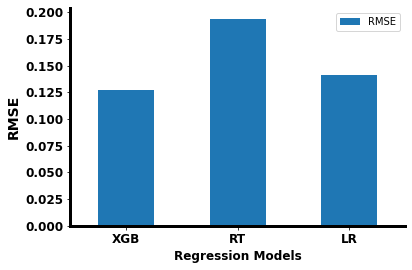

In [120]:
RMSE_df.plot.bar(x='Regression Models', y='RMSE', rot=0)
#.plot.bar()
plt.ylabel("RMSE",fontsize = 14,fontweight='bold')
plt.xlabel('Regression Models',fontsize = 12,fontweight='bold')
    # changing the fontsize of y & x ticks
plt.yticks(fontsize=12,fontweight='bold'), plt.xticks(fontsize=12,fontweight='bold')
plt.show()

In [121]:
RMSE_df_baseline.rename(columns = {"RMSE":"RMSE_Baseline"}, inplace=True)

In [122]:
RMSE_df_com = RMSE_df[['Regression Models','RMSE']] 

In [123]:
RMSE_df_com['RMSE_Baseline'] = RMSE_df_baseline['RMSE_Baseline']
RMSE_df_com

,Regression Models,RMSE,RMSE_Baseline
0,XGB,0.127309,0.129941
1,RT,0.193836,0.150853
2,LR,0.141355,0.208400


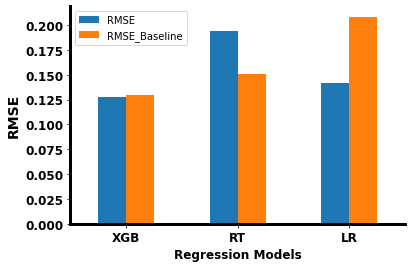

In [125]:
RMSE_df_com.plot.bar(x='Regression Models', y=['RMSE','RMSE_Baseline'], rot=0)
plt.ylabel("RMSE",fontsize = 14,fontweight='bold')
plt.xlabel('Regression Models',fontsize = 12,fontweight='bold')
    # changing the fontsize of y & x ticks
plt.yticks(fontsize=12,fontweight='bold'), plt.xticks(fontsize=12,fontweight='bold')
plt.show()

# Part 3 - Hyperparameter Tuning

Now that we are done creating out final set of features, it's time to do some hyperparameter tuning with XGBoost to optimize our model performance further.

In [126]:
X_train = create_features(df_train)
y_train = df_train.loc[:, "SalePrice"]

xgb_params = dict(
    max_depth=4,                           # maximum depth of each tree - try 2 to 10
    learning_rate=0.0058603076512435655,    # effect of each tree - try 0.0001 to 0.1
    n_estimators=5045,                     # number of trees (that is, boosting rounds) - try 1000 to 8000
    min_child_weight=2,                    # minimum number of houses in a leaf - try 1 to 10
    colsample_bytree=0.22556099175248345,   # fraction of features (columns) per tree - try 0.2 to 1.0
    subsample=0.5632348136091383,          # fraction of instances (rows) per tree - try 0.2 to 1.0
    reg_alpha=0.09888625622197889,        # L1 regularization (like LASSO) - try 0.0 to 10.0
    reg_lambda=0.00890758697724437,         # L2 regularization (like Ridge) - try 0.0 to 10.0
    num_parallel_tree=1,                   # set > 1 for boosted random forests
)

xgb = XGBRegressor(**xgb_params)
score_dataset(X_train, y_train, xgb)

0.11486377650460544

In [127]:
tuning_score = score_dataset(X_train, y_train, xgb)

In [128]:
tuning_score

0.11486377650460544

In [129]:
xgbRMSE = [RMSE_XGB, tuning_score]
xgbRMSE_df = pd.DataFrame({'XGB Model':['XGB', 'Tuned XGB'], 'RMSE':xgbRMSE})
xgbRMSE_df

,XGB Model,RMSE
0,XGB,0.127309
1,Tuned XGB,0.114864


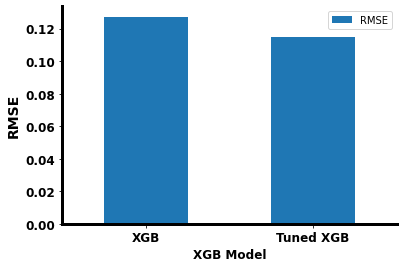

In [130]:
xgbRMSE_df.plot.bar(x='XGB Model', y='RMSE', rot=0)
plt.ylabel("RMSE",fontsize = 14,fontweight='bold')
plt.xlabel('XGB Model',fontsize = 12,fontweight='bold')
    # changing the fontsize of y & x ticks
plt.yticks(fontsize=12,fontweight='bold'), plt.xticks(fontsize=12,fontweight='bold')
plt.show()

Rather than just tuning them by hand, we're going to use a tuning library, Optuna, with XGBoost:

In [376]:
# def objective(trial):
#     xgb_params = dict(
#         max_depth=trial.suggest_int("max_depth", 2, 10),
#         learning_rate=trial.suggest_float("learning_rate", 1e-4, 1e-1, log=True),
#         n_estimators=trial.suggest_int("n_estimators", 1000, 8000),
#         min_child_weight=trial.suggest_int("min_child_weight", 1, 10),
#         colsample_bytree=trial.suggest_float("colsample_bytree", 0.2, 1.0),
#         subsample=trial.suggest_float("subsample", 0.2, 1.0),
#         reg_alpha=trial.suggest_float("reg_alpha", 1e-4, 1e2, log=True),
#         reg_lambda=trial.suggest_float("reg_lambda", 1e-4, 1e2, log=True),
#     )
#     xgb = XGBRegressor(**xgb_params)
#     return score_dataset(X_train, y_train, xgb)

# study = optuna.create_study(direction="minimize")
# study.optimize(objective, n_trials=40)
# xgb_params = study.best_params

Optuna's recommended parameter values:


```
Parameters: 
{'max_depth': 4, 'learning_rate': 0.0058603076512435655, 'n_estimators': 5045, 'min_child_weight': 2, 'colsample_bytree': 0.22556099175248345, 'subsample': 0.5632348136091383, 'reg_alpha': 0.09888625622197889, 'reg_lambda': 0.00890758697724437}. 
Score: 0.11442743288078303.
```



# Part 4 - Train Model and Create Predictions

To create our final predictions, we will take the following steps:
* create your feature set from the original data
* train XGBoost on the training data
* use the trained model to make predictions from the test set
* save the predictions to a CSV file



In [131]:
X_train, X_test = create_features(df_train, df_test)
y_train = df_train.loc[:, "SalePrice"]

xgb = XGBRegressor(**xgb_params)
# XGB minimizes MSE, but we want to minimize RMSLE
# So, we need to log-transform y to train and exp-transform the predictions
xgb.fit(X_train, np.log(y))
predictions = np.exp(xgb.predict(X_test))

output = pd.DataFrame({'Id': X_test.index, 'SalePrice': predictions})

In [132]:
output.sample(10)

,Id,SalePrice
947,2408,149302.781250
167,1628,270477.218750
620,2081,124235.437500
952,2413,132041.125000
1350,2811,157216.000000
1155,2616,140943.234375
1084,2545,136695.484375
84,1545,108411.140625
338,1799,114041.492188
88,1549,112806.640625


In [133]:
# Save predictions
output.to_csv('predictions.csv', index=False)
print("Your predictions are successfully saved!")

Your predictions are successfully saved!


In [134]:
# Save the XGB model
filename = 'ames_house_xgb_model.pkl'
pickle.dump(xgb, open(filename, 'wb'))

# Save processed test data
X_test.to_csv('df_test_processed.csv', index=False)

# Part 5 - Model Interpretation

Right now, we want to answer the following questions about our model:
* What features in the data did the model think are most important?
* For any single prediction from a model, how did each feature in the data affect that particular prediction?
* How does each feature affect the model's predictions in a big-picture sense (what is its typical effect when considered over a large number of possible predictions)?

First, we'll use SHAP Values to explain individual predictions. Afterwards, we will look at model-level insights.

In [135]:
# Pick an arbitrary row (first row starts at 0)
row_to_show = 42
data_for_prediction = X_test.iloc[[row_to_show]]

# Generate prediction
y_sample = np.exp(xgb.predict(data_for_prediction))

# Create object that can calculate Shap values
explainer = shap.TreeExplainer(xgb)

# Calculate Shap values from prediction
shap_values = explainer.shap_values(data_for_prediction)

ntree_limit is deprecated, use `iteration_range` or model slicing instead.


**For a single prediction, what features in the data did the model think are most important?**

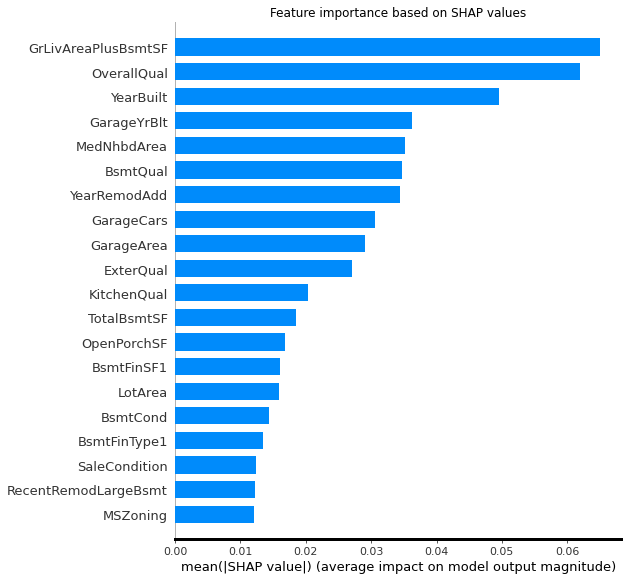

In [136]:
plt.title('Feature importance based on SHAP values')
shap.summary_plot(shap_values, data_for_prediction, plot_type="bar")

**How did each feature in the data affect that particular prediction?**

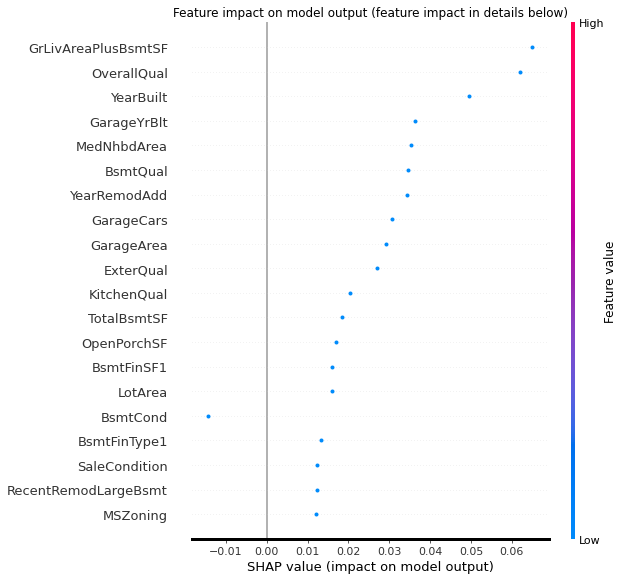

In [137]:
plt.title('Feature impact on model output (feature impact in details below)')
shap.summary_plot(shap_values, data_for_prediction)


shap.initjs()
shap.force_plot(explainer.expected_value, shap_values, data_for_prediction)

Now that we've seen the inner workings of our model in making an individual prediction, let's aggregate all the information into powerful model-level insights.

In [138]:
# Use test set to get predictions
data_for_prediction = X_test

# Generate predictions
y_sample = np.exp(xgb.predict(data_for_prediction))

# Create object that can calculate Shap values
explainer = shap.TreeExplainer(xgb)

# Calculate Shap values from predictions
shap_values = explainer.shap_values(data_for_prediction)

**How does each feature affect the model's predictions in a big-picture sense? In other words, what is its typical effect when considered over a large number of possible predictions?**

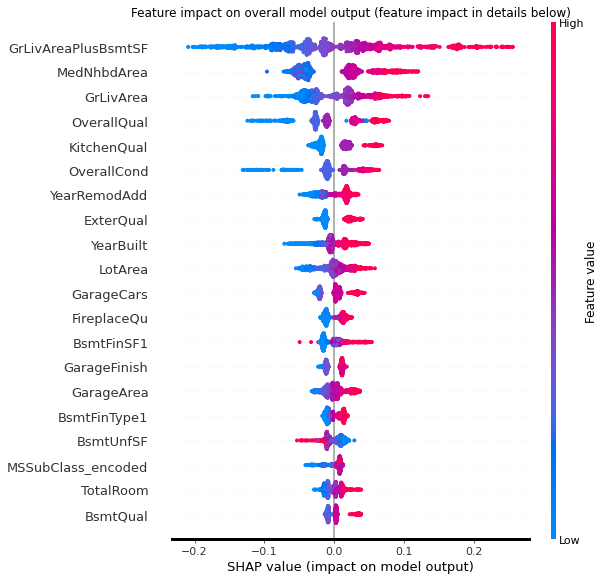

In [139]:
plt.title('Feature impact on overall model output (feature impact in details below)')
shap.summary_plot(shap_values, data_for_prediction)


shap.initjs()
shap.force_plot(explainer.expected_value, shap_values, data_for_prediction)

- https://towardsdatascience.com/wrangling-through-dataland-modeling-house-prices-in-ames-iowa-75b9b4086c96
- https://rstudio-pubs-static.s3.amazonaws.com/378009_aa5c0f996b884a68ac3d09d98865e35e.html
- https://github.com/ruthgn/Ames-Housing-Price-Prediction-App
- https://obrunet.github.io/data%20science/House_prices/
- https://inria.github.io/scikit-learn-mooc/python_scripts/datasets_ames_housing.html
- https://www.justintodata.com/logistic-regression-example-in-python/
- https://towardsdatascience.com/feature-extraction-using-principal-component-analysis-a-simplified-visual-demo-e5592ced100a